## Taxi Demand Prediction in NYC

In [116]:
import dask.dataframe as dd
import pandas as pd
import folium
from datetime import datetime
import time
import numpy as np
import matplotlib
matplotlib.use('nbagg')
import matplotlib.pylab as plt
import seaborn as sns
from matplotlib import rcParams#Size of plots  
from scipy import stats
%matplotlib inline

from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
import math

import xgboost as xgb

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

### Data Information

## ML Problem Formulation
#### - Predicting #pickups for each region in a specific time interval

In [117]:
# trips = pd.read_csv('yellow_tripdata_2016-01.csv')
trips_dd_JAN = dd.read_csv('yellow_tripdata_2016-01.csv', dtype={'tip_amount': 'float64', 'tolls_amount': 'float64'})

In [118]:
# trips.info()
# <class 'pandas.core.frame.DataFrame'>
# RangeIndex: 10906858 entries, 0 to 10906857
# Data columns (total 19 columns):
#  #   Column                 Dtype  
# ---  ------                 -----  
#  0   VendorID               int64  
#  1   tpep_pickup_datetime   object 
#  2   tpep_dropoff_datetime  object 
#  3   passenger_count        int64  
#  4   trip_distance          float64
#  5   pickup_longitude       float64
#  6   pickup_latitude        float64
#  7   RatecodeID             int64  
#  8   store_and_fwd_flag     object 
#  9   dropoff_longitude      float64
#  10  dropoff_latitude       float64
#  11  payment_type           int64  
#  12  fare_amount            float64
#  13  extra                  float64
#  14  mta_tax                float64
#  15  tip_amount             float64
#  16  tolls_amount           float64
#  17  improvement_surcharge  float64
#  18  total_amount           float64
# dtypes: float64(12), int64(4), object(3)
# memory usage: 1.5+ GB


In [119]:
print(trips_dd_JAN.info())

<class 'dask.dataframe.core.DataFrame'>
Columns: 19 entries, VendorID to total_amount
dtypes: float64(12), int64(4), string(3)None


In [120]:
trips_dd_JAN.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2016-01-01 00:00:00,2016-01-01 00:00:00,2,1.10,-73.990372,40.734695,1,N,-73.981842,40.732407,2,7.5,0.5,0.5,0.0,0.0,0.3,8.8
1,2,2016-01-01 00:00:00,2016-01-01 00:00:00,5,4.90,-73.980782,40.729912,1,N,-73.944473,40.716679,1,18.0,0.5,0.5,0.0,0.0,0.3,19.3
2,2,2016-01-01 00:00:00,2016-01-01 00:00:00,1,10.54,-73.984550,40.679565,1,N,-73.950272,40.788925,1,33.0,0.5,0.5,0.0,0.0,0.3,34.3
3,2,2016-01-01 00:00:00,2016-01-01 00:00:00,1,4.75,-73.993469,40.718990,1,N,-73.962242,40.657333,2,16.5,0.0,0.5,0.0,0.0,0.3,17.3
4,2,2016-01-01 00:00:00,2016-01-01 00:00:00,3,1.76,-73.960625,40.781330,1,N,-73.977264,40.758514,2,8.0,0.0,0.5,0.0,0.0,0.3,8.8


In [6]:
# Checking # of null values
trips_dd_JAN.isnull().sum().compute()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
pickup_longitude         0
pickup_latitude          0
RatecodeID               0
store_and_fwd_flag       0
dropoff_longitude        0
dropoff_latitude         0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
dtype: int64

### Univariate Analysis

### VendorID

In [7]:
trips_dd_JAN['VendorID'].value_counts().compute()

VendorID
2    5835429
1    5071429
Name: count, dtype: int64

Vendor ID 1 corresponds to Creative Mobile Technologies, LLC.
<br>
Vendor ID 2 corresponds to VeriFone Inc.
<br>
The Vendor ID specifically indicates the TPEP provider that supplied the particular record or information.
<br>
TPEP(Taxicab Passenger Enhancement Program) providers may offer technology solutions for processing payments, managing trips, GPS tracking and enhancing overall passenger experiences.

### Pickup Latitude and Longitude*

NYC is approx. bounded by coordinates: Latitude: (40.4774 to 40.9176) & Longitude: (-74.2591 to -73.7002)
<br>
So any locations outside of this bounding box will be considered as an outlier, since we are considering NYC data.

In [8]:
pickup_Outside_NYC = trips_dd_JAN[((trips_dd_JAN['pickup_latitude'] <= 40.4774) | (trips_dd_JAN['pickup_latitude'] >= 40.9176) | 
                              (trips_dd_JAN['pickup_longitude'] >= -73.7002) | (trips_dd_JAN['pickup_longitude'] <= -74.2591))]

In [9]:
len(pickup_Outside_NYC)

172652

In [10]:
pickup_Outside_NYC.head(1000)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
38,1,2016-01-01 00:00:19,2016-01-01 00:19:33,1,3.40,0.0,0.0,1,N,0.000000,0.00000,2,14.5,0.5,0.5,0.00,0.0,0.3,15.80
67,2,2016-01-01 00:00:41,2016-01-01 00:00:46,5,0.00,0.0,0.0,3,N,0.000000,0.00000,2,20.0,0.5,0.0,0.00,0.0,0.3,20.80
150,1,2016-01-01 00:01:34,2016-01-01 00:15:38,1,2.90,0.0,0.0,1,N,0.000000,0.00000,2,12.0,0.5,0.5,0.00,0.0,0.3,13.30
156,2,2016-01-01 00:01:36,2016-01-01 00:20:36,1,3.55,0.0,0.0,1,N,0.000000,0.00000,1,15.5,0.5,0.5,3.36,0.0,0.3,20.16
158,2,2016-01-01 00:01:37,2016-01-01 00:25:25,2,1.53,0.0,0.0,1,N,0.000000,0.00000,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64124,1,2016-01-01 00:53:57,2016-01-01 01:00:31,1,0.80,0.0,0.0,1,N,0.000000,0.00000,1,6.0,0.5,0.5,1.45,0.0,0.3,8.75
64139,1,2016-01-01 00:53:59,2016-01-01 01:12:42,1,2.10,0.0,0.0,1,N,-73.993484,40.73613,1,13.0,0.5,0.5,2.85,0.0,0.3,17.15
64267,1,2016-01-01 00:54:15,2016-01-01 01:18:26,2,3.60,0.0,0.0,1,N,0.000000,0.00000,2,17.5,0.5,0.5,0.00,0.0,0.3,18.80
64305,1,2016-01-01 00:54:19,2016-01-01 01:34:55,4,5.90,0.0,0.0,1,N,0.000000,0.00000,1,27.0,0.5,0.5,5.00,0.0,0.3,33.30


In [ ]:
# plt.figure(figsize=(30,8))
# plt.scatter(trips_dd_JAN['pickup_longitude'].compute(), trips_dd_JAN['pickup_latitude'].compute())

In [11]:
# Central point of NYC: Latitude: 40.7128° N Longitude: -74.0060° W
map_osm = folium.Map(location=[40.7128, -74.0060])

print("Number of pickups outside NYC: {}".format(len(pickup_Outside_NYC)))

for i,j in pickup_Outside_NYC.head(1000).iterrows():
        folium.Marker(list((j['pickup_latitude'],j['pickup_longitude']))).add_to(map_osm)
map_osm

Number of pickups outside NYC: 172652


Can see a lot of pickups outside NYC, will be removing it during data preparation; Possible reason behind this could be some gps error(not calibrated)
<br>
A lot of the records have latitude and longitude as 0 which is the intersection of equator and prime meridian.

In [12]:
Dropoff_Outside_NYC = trips_dd_JAN[((trips_dd_JAN['dropoff_latitude'] <= 40.4774) | (trips_dd_JAN['dropoff_latitude'] >= 40.9176) | 
                              (trips_dd_JAN['dropoff_longitude'] >= -73.7002) | (trips_dd_JAN['dropoff_longitude'] <= -74.2591))]

map_osm = folium.Map(location=[40.7128, -74.0060])

print("Number of dropoff outside NYC: {}".format(len(Dropoff_Outside_NYC)))

for i,j in Dropoff_Outside_NYC.head(1000).iterrows():
        folium.Marker(list((j['dropoff_latitude'],j['dropoff_longitude']))).add_to(map_osm)
map_osm

Number of dropoff outside NYC: 170024


### Note: treat the outliers for pickup and dropoff coordinates
<br>

Removing the dropoff outside nyc, since once a passenger is dropped, our target is to find the regions with higher demand(this finding is limited to nyc not outside)

## Trip duration*
##### Trip_duration = pickup - dropoff
##### pickup and dropoff time has string[pyarrow] datatype; convert to datetime object

In [3]:
# a = trips_dd_JAN['tpep_pickup_datetime'].head(1)
# need to convert to datetime object

In [279]:
# Minimum time
# dd.to_datetime(trips_dd_JAN['tpep_pickup_datetime'], format = "%Y-%m-%d %H:%M:%S").compute().min()
# Timestamp('2015-01-01 00:00:00')

In [15]:
# # dd.to_datetime(trips_dd_JAN['tpep_pickup_datetime'].head(), format = "%Y-%m-%d %H:%M:%S").compute()
# # 0   2015-01-15 19:05:39
# # 1   2015-01-10 20:33:38
# # 2   2015-01-10 20:33:38
# # 3   2015-01-10 20:33:39
# # 4   2015-01-10 20:33:39
# # dtype: datetime64[ns]

# (dd.to_datetime(trips_dd_JAN['tpep_pickup_datetime'].head(), format = "%Y-%m-%d %H:%M:%S").compute() - datetime(2015,1,1)).dt.total_seconds()/60

0    525600.0
1    525600.0
2    525600.0
3    525600.0
4    525600.0
dtype: float64

In [16]:
# ((dd.to_datetime(trips_dd_JAN['tpep_dropoff_datetime'].head(), format = "%Y-%m-%d %H:%M:%S").compute() - dd.to_datetime(trips_dd_JAN['tpep_pickup_datetime'].head(), format = "%Y-%m-%d %H:%M:%S").compute()).dt.total_seconds())/60

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
dtype: float64

In [17]:
# dd.to_datetime(a, format = "%Y-%m-%d %H:%M:%S").compute()

0   2016-01-01
dtype: datetime64[ns]

### Using pickup and dropoff time to calculate trip duration

In [121]:
start = datetime.now()

# converting pickup and dropoff time to datetime object
trips_dd_JAN['tpep_dropoff_datetime'] = dd.to_datetime(trips_dd_JAN['tpep_dropoff_datetime'], format = "%Y-%m-%d %H:%M:%S")
trips_dd_JAN['tpep_pickup_datetime'] = dd.to_datetime(trips_dd_JAN['tpep_pickup_datetime'], format = "%Y-%m-%d %H:%M:%S")

# other way is to by calculating time since epoch and then subtract it

# calculating the duration of each trip
# for i in range(31):
    # partition = trips_dd_JAN.get_partition(i)
    # trips_dd_JAN.get_partition(i).compute()['trip_duration'] = (partition['tpep_dropoff_datetime'] - partition['tpep_pickup_datetime']).compute().dt.total_seconds()/60
# duration = trips_dd_JAN[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()

# the diff in pickup and dropoff will give output in datetime format(days, hours); convert it into seconds and divide by 60 to get in minutes
trip_time = ((trips_dd_JAN['tpep_dropoff_datetime'] - trips_dd_JAN['tpep_pickup_datetime']).dt.total_seconds()/60).compute()
trips_dd1 = trips_dd_JAN.compute()
trips_dd1['trip_duration'] = trip_time
print("{}".format(datetime.now()-start))
# Apply the function to each partition

# Compute the result
# trips_dd_JAN = trips_dd_JAN.compute()
# trips_dd_JAN['trip_duration'] =  ((trips_dd_JAN['tpep_dropoff_datetime'] - trips_dd_JAN['tpep_pickup_datetime']).dt.total_seconds()/60).compute()  # in minutes

0:02:34.826113


In [122]:
# trips_new will be used for outier treatment at the end of eda
trips_new = trips_dd1.copy()

In [131]:
trips_dd1

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
5,2,2016-01-01 00:00:00,2016-01-01 00:18:30,2,5.52,-73.980118,40.743050,1,N,-73.913490,40.763142,2,19.0,0.5,0.5,0.00,0.0,0.3,20.30,18.500000
6,2,2016-01-01 00:00:00,2016-01-01 00:26:45,2,7.45,-73.994057,40.719990,1,N,-73.966362,40.789871,2,26.0,0.5,0.5,0.00,0.0,0.3,27.30,26.750000
7,1,2016-01-01 00:00:01,2016-01-01 00:11:55,1,1.20,-73.979424,40.744614,1,N,-73.992035,40.753944,2,9.0,0.5,0.5,0.00,0.0,0.3,10.30,11.900000
8,1,2016-01-01 00:00:02,2016-01-01 00:11:14,1,6.00,-73.947151,40.791046,1,N,-73.920769,40.865578,2,18.0,0.5,0.5,0.00,0.0,0.3,19.30,11.200000
9,2,2016-01-01 00:00:02,2016-01-01 00:11:08,1,3.21,-73.998344,40.723896,1,N,-73.995850,40.688400,2,11.5,0.5,0.5,0.00,0.0,0.3,12.80,11.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418488,2,2016-01-31 21:28:59,2016-01-31 22:01:58,1,7.83,-74.002953,40.750481,1,N,-73.958153,40.656689,1,29.0,0.5,0.5,5.00,0.0,0.3,35.30,32.983333
418489,2,2016-01-31 22:36:41,2016-01-31 22:45:04,1,2.50,-74.009277,40.717049,1,N,-73.994637,40.750488,1,9.5,0.5,0.5,2.16,0.0,0.3,12.96,8.383333
418490,2,2016-01-31 22:53:00,2016-01-31 22:59:37,1,1.68,-74.003578,40.750751,1,N,-74.002159,40.734909,1,7.0,0.5,0.5,1.00,0.0,0.3,9.30,6.616667
418491,2,2016-01-31 23:00:11,2016-01-31 23:12:08,1,2.65,-74.002159,40.734852,1,N,-73.999680,40.761669,1,11.0,0.5,0.5,1.00,0.0,0.3,13.30,11.950000


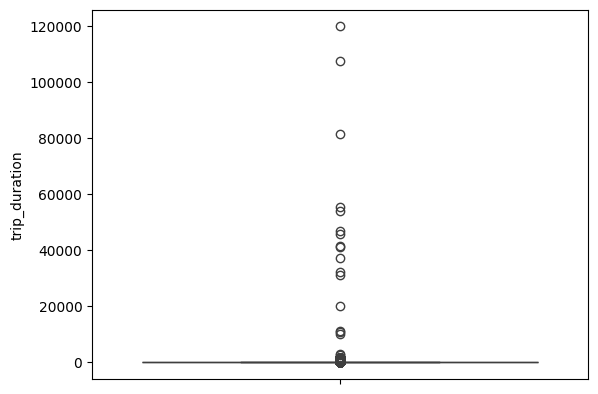

In [21]:
sns.boxplot(y="trip_duration", data = trips_dd1)
plt.show()

Thats a lot of outliers, lets check with quantiles

In [22]:
trips_dd1['trip_duration'].describe()

count    1.090686e+07
mean     1.526881e+01
std      8.690711e+01
min     -4.395000e+01
25%      6.333333e+00
50%      1.046667e+01
75%      1.688333e+01
max      1.199127e+05
Name: trip_duration, dtype: float64

Max trip duration is 119912 minutes which is unreal and min is -ve

In [23]:
trips_dd1['trip_duration'].quantile([0.1, 0.3, 0.6, 0.9, 0.99, 1])

0.10         3.933333
0.30         7.100000
0.60        12.550000
0.90        25.516667
0.99        53.900000
1.00    119912.700000
Name: trip_duration, dtype: float64

In [24]:
trips_dd1['trip_duration'].quantile([0.999, 0.9999, 0.99999, 0.999999, 1])

0.999000      1424.050000
0.999900      1438.700000
0.999990      1439.416667
0.999999     31226.210335
1.000000    119912.700000
Name: trip_duration, dtype: float64

The upper values here are unreal:- 548555 minutes = 9142 hrs for a single trip
<br>
And we also have some negative values
<br>
<br>

#### Note
NYC website:- TLC will count the time when a driver has a passenger in the vehicle ("passenger time"). Drivers will be limited to 10 hours of passenger time in a 24-hour period and 60 hours of passenger time each week.
<br>
https://www.nyc.gov/site/tlc/about/fatigued-driving-prevention-frequently-asked-questions.page
<br>
<br>
Considering the maximum allowed trip duration is 10 hours a day for a taxi driver. So any value beyond this will be considered as an outlier.
<br><br>
Still for a single trip, 10 hrs is a big amount of time?????????????

In [248]:
# trips_dd1[(trips_dd1['trip_duration'] > 1) & (trips_dd1['trip_duration'] < 600)]['trip_duration'].describe()
# count    1.263497e+07
# mean     1.241265e+01
# std      1.001266e+01
# min      1.016667e+00
# 25%      6.183333e+00
# 50%      1.001667e+01
# 75%      1.583333e+01
# max      5.993667e+02

# filtering data based on condition that trip duration should be between 1 and 600 minutes
trips_dd1 = trips_dd1[(trips_dd1['trip_duration'] > 1) & (trips_dd1['trip_duration'] < 600)]

0:00:42.698319


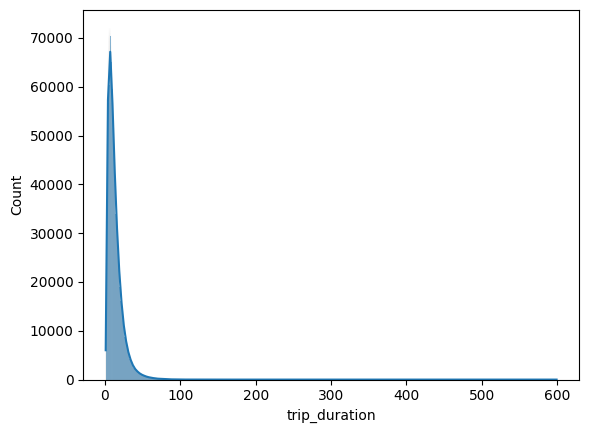

In [26]:
start = datetime.now()
sns.histplot(trips_dd1['trip_duration'], kde=True)
print(datetime.now()-start)

The density plot looks like a lognormal distribution, so taking the log of the feature values might convert it into a gaussian dist as per def.

<Axes: xlabel='trip_duration', ylabel='Count'>

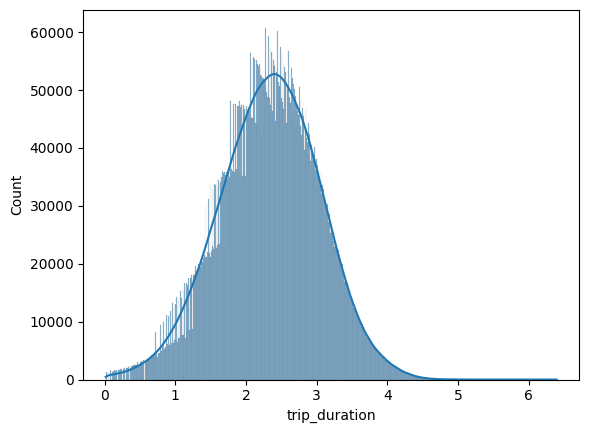

In [27]:
sns.histplot(np.log(trips_dd1['trip_duration']), kde=True)

Well, its not exactly normal, the right tail is a little longer but much better than the prev one
<br><br>
Remember:- to take a look at the bigger values of the trip duration.

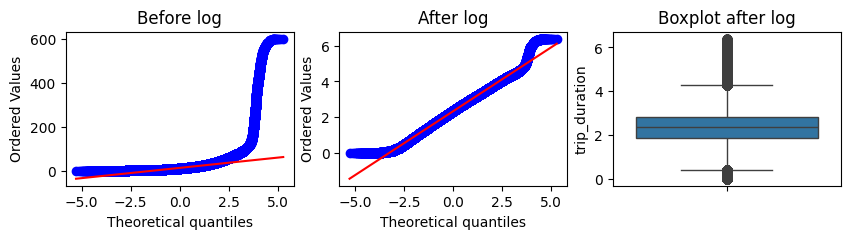

In [28]:
%matplotlib inline
plt.figure(figsize=(10,2))
plt.subplot(131)
stats.probplot((trips_dd1['trip_duration']), plot=plt)
plt.title("Before log")
plt.subplot(132)
stats.probplot(np.log(trips_dd1['trip_duration']), plot=plt)
plt.title("After log")
plt.subplot(133)
sns.boxplot(y=np.log(trips_dd1['trip_duration']), data = trips_dd1)
plt.title("Boxplot after log")
plt.show()

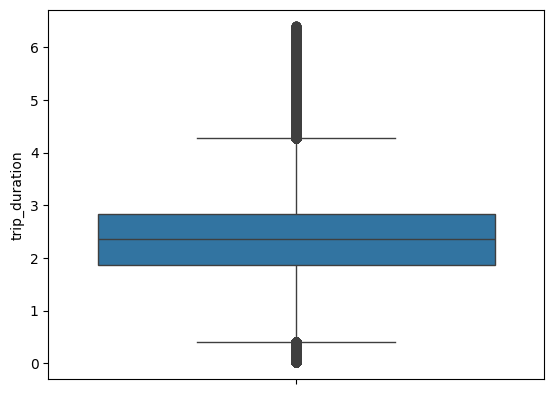

In [29]:
sns.boxplot(y=np.log(trips_dd1['trip_duration']), data = trips_dd1)
plt.show()

### Note
##### Take log of trip durations
##### check at the bigger values of the trip duration.
<br><br>

### #Passenger Count
##### The number of passengers in the vehicle. This is a driver entered value
<br>
The maximum amount of passengers allowed in a yellow taxicab by law is four (4) in a four (4) passenger taxicab or five (5) passengers in a five (5) passenger taxicab, except that an additional passenger must be accepted if such passenger is under the age of seven (7) and is held on the lap of an adult passenger seated in the rear..

In [277]:
trips_dd1['passenger_count'].value_counts()

passenger_count
1    7726984
2    1561977
5     601079
3     436431
6     369155
4     210641
0        520
8         26
9         23
7         22
Name: count, dtype: int64

Majority of the trips has 1 passenger followed by 2.
<br>
We have 520 "0" passenger counts. Possibly, the driver forgot to enter the value, some glitch?

##### 7,8,9 is a lot to accommodate in a single taxi. Anyway it does not look like this feature will be of any help for the problem statement

But since the count is very low for 7,8,9 and for 6, taking the additional passenger to be a child, letting this go for now.
<br>

### #Trip Distance*
##### The elapsed trip distance in miles reported by the taximeter.

In [31]:
trips_dd1['trip_distance'].quantile([0.2, 0.5, 0.8, 0.9, 0.99, 1])

0.20          0.90
0.50          1.70
0.80          3.70
0.90          6.55
0.99         18.66
1.00    8000010.00
Name: trip_distance, dtype: float64

8000010 miles is very unreal

In [123]:
trips_dd1['trip_distance'].quantile([0.999, 0.9999, 0.99999, 0.999999, 1])

0.999000    2.490000e+01
0.999900    4.000000e+01
0.999990    8.124715e+01
0.999999    4.874182e+02
1.000000    8.000010e+06
Name: trip_distance, dtype: float64

##### checked on google map, trip distance for city's two ends is around 28 miles.

In [133]:
trips_dd1_td = trips_dd1[(trips_dd1.trip_distance>0) & (trips_dd1.trip_distance<28)]

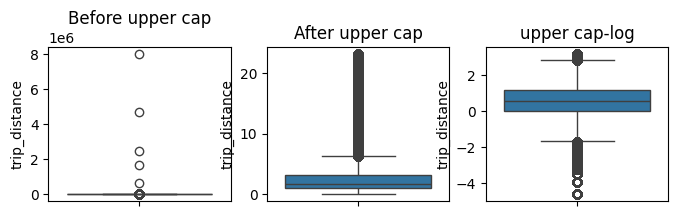

In [34]:
plt.figure(figsize=(8,2))
plt.subplot(131)
sns.boxplot(y=trips_dd1['trip_distance'])
plt.title("Before upper cap")
plt.subplot(132)
sns.boxplot(y=trips_dd1_td['trip_distance'])
plt.title("After upper cap")
plt.subplot(133)
sns.boxplot(y=np.log(trips_dd1_td['trip_distance']))
plt.title("upper cap-log")
plt.show()

In [134]:
# Checking the average distance covered by yellow taxi
Speed = trips_dd1_td['trip_distance']/trips_dd1_td['trip_duration'] # miles per minute

In [135]:
Speed.describe()

count    1.078423e+07
mean     2.021200e-01
std      1.163512e-01
min      2.787327e-05
25%      1.328125e-01
50%      1.773399e-01
75%      2.403152e-01
max      2.335385e+01
dtype: float64

##### In 1 min, a taxi driver can cover 0.2018 miles
<br>

### #RateCodeID

In [37]:
# The final rate code in effect at the end of the trip.
# 1= Standard rate
# 2=JFK
# 3=Newark
# 4=Nassau or Westchester
# 5=Negotiated fare
# 6=Group ride

In [38]:
trips_dd_JAN['RatecodeID'].value_counts().compute()

RatecodeID
1     10626315
2       225019
5        33688
3        16822
4         4696
99         216
6          102
Name: count, dtype: int64

Majority of the trips have a standard rate code followed by JFK(trips to airport)
<br>
Either swap the 99 rate code with 5 or merge 5 and 6 rate codes, since their counts are very low as compared to the rest

In [40]:
# sns.countplot(x = trips_dd_JAN['RateCodeID'].compute())
# plt.show()

### #Store_and_fwd_flag

In [278]:
# This flag indicates whether the trip record was held in vehicle
# memory before sending to the vendor, aka “store and forward,”
# because the vehicle did not have a connection to the server.
# Y= store and forward trip
# N= not a store and forward trip

In [42]:
trips_dd_JAN['store_and_fwd_flag'].value_counts().compute()

store_and_fwd_flag
N    10843625
Y       63233
Name: count, dtype: int64[pyarrow]

In [43]:
# 

### #Payment_type 

In [44]:
# A numeric code signifying how the passenger paid for the trip.
# 1= Credit card
# 2= Cash
# 3= No charge
# 4= Dispute
# 5= Unknown
# 6= Voided trip

In [45]:
trips_dd_JAN['payment_type'].value_counts().compute()

payment_type
1    7181476
2    3673651
3      38319
4      13411
5          1
Name: count, dtype: int64

### #Total_amount*
The total amount charged to passengers. Does not include cash tips.

In [46]:
# Checking total amount instead of Fare_amount, Extra, MTA_tax, Improvement_surcharge, Tip_amount, Tolls_amount, Congestion_Surcharge & Airport_fee 
# since we dont need these features for the problem statement

In [47]:
trips_dd_JAN['total_amount'].quantile([0, 0.2, 0.5, 0.9, 0.99, 1]).compute()

0.00      -958.40
0.20         8.30
0.50        12.36
0.90        30.96
0.99        70.01
1.00    111271.65
Name: total_amount, dtype: float64

-958 and 111271, both are unreal.(either perform capping or remove these records)

In [48]:
# trips_dd1_td['trip_distance'].max()
# 23.09

https://www.nyc.gov/site/tlc/passengers/taxi-fare.page
<br>
The initial charge is 3 USD & 3.5 USD for each mile as per current scenario- the max trip distance is 28 miles
<br><br>
3 + 28*3.5 + 0.5(MTA) + 4.5(surcharges) + toll charges = 101.5 + toll charges + 20; surcharge for newark is very high(20 USD)
<br><br>
23% hike in 2022 since 2012 - https://www.bloomberg.com/news/articles/2022-11-15/nyc-taxi-cab-fares-to-rise-23-in-first-increase-since-2012 
<br>
Since, we will consider dropoff and pickup inside NYC, so no point of adding extra charges for dropoff outside NYC
<br>
For 2016, (100/123) * 121.5 = 98.78 + toll charges + 1.25 for airports
<br>
#### ##Considering a max fare of 100 USD and min fare will be 3 USD as it is the initial charge

In [136]:
trips_dd1_td_ta = trips_dd1_td[(trips_dd1_td['total_amount'] > 3) & (trips_dd1_td['total_amount'] < 100)]

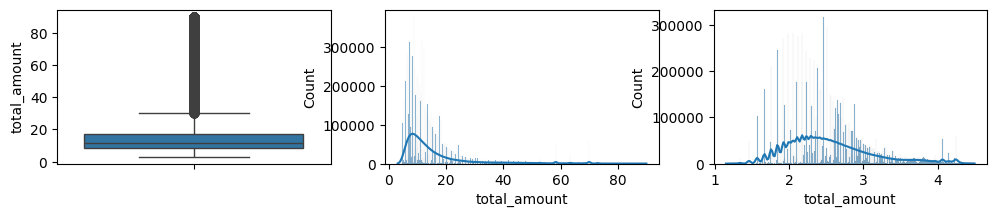

In [50]:
plt.figure(figsize=(12,2))
plt.subplot(131)
sns.boxplot(y = trips_dd1_td_ta['total_amount'])
plt.subplot(132)
sns.histplot(trips_dd1_td_ta['total_amount'], kde=True)
plt.subplot(133)
sns.histplot(np.log(trips_dd1_td_ta['total_amount']), kde=True)
plt.show()

### Removal of outliers based on domain knowledge

In [137]:
total_records = trips_new.shape[0]

In [138]:
# Pickup and dropoff coordinates
trips_new = trips_new[(trips_new['pickup_latitude'] >= 40.4774) & (trips_new['pickup_latitude'] <= 40.9176) &
                     (trips_new['pickup_longitude'] >= -74.2591) & (trips_new['pickup_longitude'] <= -73.7002) &
                     (trips_new['dropoff_latitude'] >= 40.4774) & (trips_new['dropoff_latitude'] <= 40.9176) &
                     (trips_new['dropoff_longitude'] >= -74.2591) & (trips_new['dropoff_longitude'] <= -73.7002)]

trips_new = trips_new[(trips_new['trip_duration'] > 1) & (trips_new['trip_duration'] < 600)]

trips_new = trips_new[(trips_new['trip_distance']>0) & (trips_new['trip_distance']<28)]

trips_new = trips_new[(trips_new['total_amount'] > 3) & (trips_new['total_amount'] < 100)]

print("Number of records removed: {}".format(total_records - trips_new.shape[0]))

Number of records removed: 297489


In [139]:
trips_new

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
5,2,2016-01-01 00:00:00,2016-01-01 00:18:30,2,5.52,-73.980118,40.743050,1,N,-73.913490,40.763142,2,19.0,0.5,0.5,0.00,0.0,0.3,20.30,18.500000
6,2,2016-01-01 00:00:00,2016-01-01 00:26:45,2,7.45,-73.994057,40.719990,1,N,-73.966362,40.789871,2,26.0,0.5,0.5,0.00,0.0,0.3,27.30,26.750000
7,1,2016-01-01 00:00:01,2016-01-01 00:11:55,1,1.20,-73.979424,40.744614,1,N,-73.992035,40.753944,2,9.0,0.5,0.5,0.00,0.0,0.3,10.30,11.900000
8,1,2016-01-01 00:00:02,2016-01-01 00:11:14,1,6.00,-73.947151,40.791046,1,N,-73.920769,40.865578,2,18.0,0.5,0.5,0.00,0.0,0.3,19.30,11.200000
9,2,2016-01-01 00:00:02,2016-01-01 00:11:08,1,3.21,-73.998344,40.723896,1,N,-73.995850,40.688400,2,11.5,0.5,0.5,0.00,0.0,0.3,12.80,11.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418488,2,2016-01-31 21:28:59,2016-01-31 22:01:58,1,7.83,-74.002953,40.750481,1,N,-73.958153,40.656689,1,29.0,0.5,0.5,5.00,0.0,0.3,35.30,32.983333
418489,2,2016-01-31 22:36:41,2016-01-31 22:45:04,1,2.50,-74.009277,40.717049,1,N,-73.994637,40.750488,1,9.5,0.5,0.5,2.16,0.0,0.3,12.96,8.383333
418490,2,2016-01-31 22:53:00,2016-01-31 22:59:37,1,1.68,-74.003578,40.750751,1,N,-74.002159,40.734909,1,7.0,0.5,0.5,1.00,0.0,0.3,9.30,6.616667
418491,2,2016-01-31 23:00:11,2016-01-31 23:12:08,1,2.65,-74.002159,40.734852,1,N,-73.999680,40.761669,1,11.0,0.5,0.5,1.00,0.0,0.3,13.30,11.950000


### Clustering - segmenting the new york city map to help in the demand prediction for nearby regions

In [145]:
from haversine import haversine, Unit
# finds distance between two geo coordinates
# haversine((53.51817944679777, -113.51212604101795), (53.51817944679777, -113.49491157019018), unit=Unit.MILES)

In [141]:
location = trips_new[['pickup_latitude', 'pickup_longitude']]

In [144]:
# haversine(kmeans.cluster_centers_[0], kmeans.cluster_centers_[1], unit=Unit.MILES)
# 13.283448653895247

In [59]:
# As per internet, the average waiting time for a taxi to arrive is 5-10mins(1.04 - 2.08 miles). But if we consider high traffic or winter or 
# at the airports, it might take longer, lets say 10-20 mins(2.08 - 4.16 miles). 
# we cant have too small clusters or too big. 
# if we want to predict the number of pickups in a time interval, then our taxi should be able to reach the pickup location within than time period.
# Nowadays, UBER has become very popular and if want to compete with them, we need to pick the customers before them
# average waiting period for uber is 10-15 mins in NYC(as per internet)
# So, 10 mins is a suitable waiting period. As per that, our distance between different regions should be less than 2.08 miles.
# Now we need a lower bound; 
# If the clusters become too small, it might lead to sparse data and challenges in making accurate predictions. 
# A practical approach is to ensure that each cluster has a minimum number of pickups or covers a minimum area.
# the manhattan area has the largest number of pickups, which means the regions/clusters will be smaller here,
# as kmeans has the tendency to create clusters of equal sizes(same no of data points)

### Checking the demand in manhattan(downtown) of NYC

In [60]:
# Bounding box of manhattan:
# Latitude Range: 40.7009 to 40.8770
# Longitude Range: -74.0186 to -73.9104

trips_manhattan = trips_new[(trips_new['pickup_latitude'] >= 40.7009) & (trips_new['pickup_latitude'] <= 40.8770) &
                     (trips_new['pickup_longitude'] >= -74.0186) & (trips_new['pickup_longitude'] <= -73.9104)]
print("Percentage of total pickups in manhattan: {}%".format(round((trips_manhattan.shape[0]/trips_new.shape[0])*100,2)))
print("Average speed in manhattan area: {} miles per minute".format(round(np.average(trips_manhattan['trip_distance']/trips_manhattan['trip_duration']), 3)))

Percentage of total pickups in manhattan: 93.88%
Average speed in manhattan area: 0.19 miles per minute


In [61]:
trips_manhattan.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
5,2,2016-01-01 00:00:00,2016-01-01 00:18:30,2,5.52,-73.980118,40.743050,1,N,-73.913490,40.763142,2,19.0,0.5,0.5,0.0,0.0,0.3,20.3,18.50
6,2,2016-01-01 00:00:00,2016-01-01 00:26:45,2,7.45,-73.994057,40.719990,1,N,-73.966362,40.789871,2,26.0,0.5,0.5,0.0,0.0,0.3,27.3,26.75
7,1,2016-01-01 00:00:01,2016-01-01 00:11:55,1,1.20,-73.979424,40.744614,1,N,-73.992035,40.753944,2,9.0,0.5,0.5,0.0,0.0,0.3,10.3,11.90
8,1,2016-01-01 00:00:02,2016-01-01 00:11:14,1,6.00,-73.947151,40.791046,1,N,-73.920769,40.865578,2,18.0,0.5,0.5,0.0,0.0,0.3,19.3,11.20
9,2,2016-01-01 00:00:02,2016-01-01 00:11:08,1,3.21,-73.998344,40.723896,1,N,-73.995850,40.688400,2,11.5,0.5,0.5,0.0,0.0,0.3,12.8,11.10


In [62]:
print("Average speed in manhattan area: {}".format(np.average(trips_manhattan['trip_distance']/trips_manhattan['trip_duration'])))

Average speed in manhattan area: 0.19044967208389688


### Comparing demand in manhattan with a different region(Staten Island) in NYC

In [63]:
# Latitude Range: 40.4774 to 40.6494
# Longitude Range: -74.2591 to -74.0342

trips_staten = trips_new[(trips_new['pickup_latitude'] >= 40.4774) & (trips_new['pickup_latitude'] <= 40.6494) &
                     (trips_new['pickup_longitude'] >= -74.2591) & (trips_new['pickup_longitude'] <= -73.0342)]
print("Percentage of total pickups in Staten islan: {}%".format(round((trips_staten.shape[0]/trips_new.shape[0])*100,2)))
print("Average speed in Staten island: {} miles per minute".format(round(np.average(trips_staten['trip_distance']/trips_staten['trip_duration']), 3)))

Percentage of total pickups in Staten islan: 2.18%
Average speed in Staten island: 0.441 miles per minute


manhattan: 2 miles in 10 mins
<br>
Staten island: 4.4 miles in 10 mins
<br>relation to cluster size

### Determining the ideal no of clusters we need 

In [148]:
start = datetime.now()
table = {"Cluster size": [], "Avg. #clusters < 2": [], "Avg. #clusters > 2": [], "Min dist": [], "% of #clusters < 2": []}
for i in range(20, 50):
    kmeans = MiniBatchKMeans(n_clusters=i, batch_size=10000, random_state=10, n_init = 5).fit(location)
    cluster_centres = kmeans.cluster_centers_
    
    greater2 = []
    g2 = 0
    less2 = [] # [2,3,6,7 .... ] each element represents the no of clusters for each clustering(with n clusters) with inter cluster distance < 2 miles
    l2 = 0
    min_dist = 1000
# i=20: 20 segments in NYC; 2 nested for loops- find distance of each cluster centre with the rest centres, if less than 2(then l2+1) else g2+1
# 
    for j in range(0, i):
        g2 = 0
        l2 = 0
        for k in range(0, i):
            if k!=j:
                distance = haversine(cluster_centres[j], cluster_centres[k], unit=Unit.MILES)
                min_dist = min(min_dist, distance) # finding the minimum distance between 2 region centres
                if distance <= 2:
                    l2 += 1
                else:
                    g2 += 1
        greater2.append(g2)
        less2.append(l2)
    # print(greater2)
    # print(less2)
    table["Cluster size"].append(i)
    table["Min dist"].append(min_dist)
    table['% of #clusters < 2'].append(((np.ceil(sum(less2)/len(less2)))/i)*100) # %age of clusters with inter-cluster distance less than 2 miles
    table["Avg. #clusters < 2"].append(np.ceil(sum(less2)/len(less2))) # 
    table["Avg. #clusters > 2"].append(np.ceil(sum(greater2)/len(greater2)))
print(datetime.now() - start)

0:01:07.243220


In [149]:
pd.DataFrame(table)

,Cluster size,Avg. #clusters < 2,Avg. #clusters > 2,Min dist,% of #clusters < 2
0,20,5.0,15.0,0.542411,25.000000
1,21,5.0,16.0,0.661676,23.809524
2,22,6.0,16.0,0.503241,27.272727
3,23,6.0,17.0,0.503735,26.086957
4,24,6.0,18.0,0.533914,25.000000
5,25,6.0,19.0,0.491134,24.000000
6,26,7.0,19.0,0.390543,26.923077
7,27,7.0,20.0,0.395660,25.925926
8,28,7.0,21.0,0.459335,25.000000
9,29,7.0,22.0,0.532483,24.137931


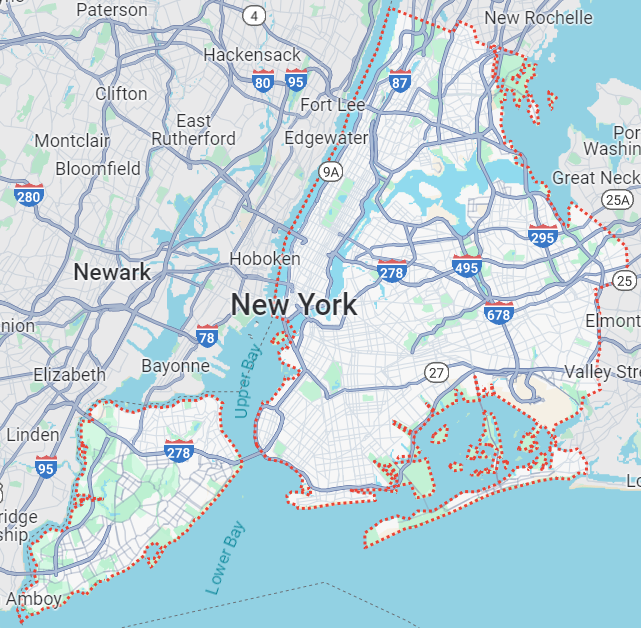

In [66]:
# 34,21, 26,27, 45, 47, 48

## KMeans with 27 clusters

In [67]:
# kmeans_27 = MiniBatchKMeans(n_clusters=27, batch_size=10000, random_state=10, n_init = 5).fit(location)
# cluster_centres_27 = kmeans_27.cluster_centers_
# pickup_clusters_27 = kmeans_27.predict(trips_new[['pickup_latitude', 'pickup_longitude']])

# len(cluster_centres_27)

# trips_new[(trips_new['pickup_latitude'] >= 40.4774) & (trips_new['pickup_latitude'] <= 40.9176) &
#                      (trips_new['pickup_longitude'] >= -74.2591) & (trips_new['pickup_longitude'] <= -73.7002)]

# # *****************************************************************************

# # from scipy.spatial import Voronoi, voronoi_plot_2d 
# start = datetime.now()

# plt.figure(figsize=(30,20))
# # city_long_border = (-74.26, -73.7)
# # city_lat_border = (40.5, 40.92)

# #without staten island
# city_long_border = (-74.04, -73.69)
# city_lat_border = (40.55, 40.92)

# # vor = Voronoi(cluster_centres[:, ::-1]) 
# # voronoi_plot_2d(vor, show_vertices=False, line_alpha=1, point_size=0) 
# # plt.scatter(cluster_centres[:, 1], cluster_centres[:, 0], s=5, label = '\n'.join(labels), marker='X') 
# plt.scatter(trips_new['pickup_longitude'], trips_new['pickup_latitude'], s=2, lw=0,
#           c=pickup_clusters_27, cmap='tab20', alpha=1, label = '\n'.join(labels_27))
# for cluster_num_27, centroid_27 in enumerate(cluster_centres_27):
#     plt.text(centroid_27[1], centroid_27[0], str(cluster_num_27), color='black', fontsize=16, ha = 'center', va = 'center', weight='bold')

# # legend_labels = [f"Cluster {cluster_num} ({np.sum(pickup_clusters == cluster_num)} points)" for cluster_num in range(len(cluster_centres))]
# # plt.legend(label = labels, loc='upper right')
# # plt.legend(labels = labels)
# plt.legend(loc="upper right")
# plt.xlim(city_long_border)
# plt.ylim(city_lat_border)
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')

# plt.savefig('output_plot_27.png', dpi=100)

# plt.show()
# print("Time taken: {}".format(datetime.now()-start))



# # *****************************************************************************

# labels_27 = [f"Cluster {cluster_num_27}: ({np.sum(pickup_clusters_27 == cluster_num_27)} pickups)" for cluster_num_27 in range(len(cluster_centres_27))]

# # *****************************************************************************

# from scipy.spatial import Voronoi, voronoi_plot_2d 
# start = datetime.now()

# plt.figure(figsize=(30,12))
# # Coordinates including staten island
# city_long_border = (-74.26, -73.7)
# city_lat_border = (40.5, 40.92)

# # coordinates without staten island
# # city_long_border = (-74.04, -73.698)
# # city_lat_border = (40.5, 40.92)

# vor = Voronoi(cluster_centres_27[:, ::-1]) 
# voronoi_plot_2d(vor, show_vertices=False, line_alpha=1, point_size=5, line_colors='black') 
# plt.scatter(cluster_centres_27[:, 0], cluster_centres_27[:, 1], s=5, c='red') 
# plt.scatter(trips_new['pickup_longitude'], trips_new['pickup_latitude'], s=1, lw=0,
#           c=pickup_clusters_27, cmap='tab20', alpha=1)
# # for cluster_num, centroid in enumerate(cluster_centres):
#     # plt.text(centroid[1], centroid[0], str(cluster_num), color='black', fontsize=6, weight='bold', ha = 'center', va = 'center')
# plt.xlim(city_long_border)
# plt.ylim(city_lat_border)
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')

# plt.show()
# print("Time taken: {}".format(datetime.now()-start))

# # *****************************************************************************



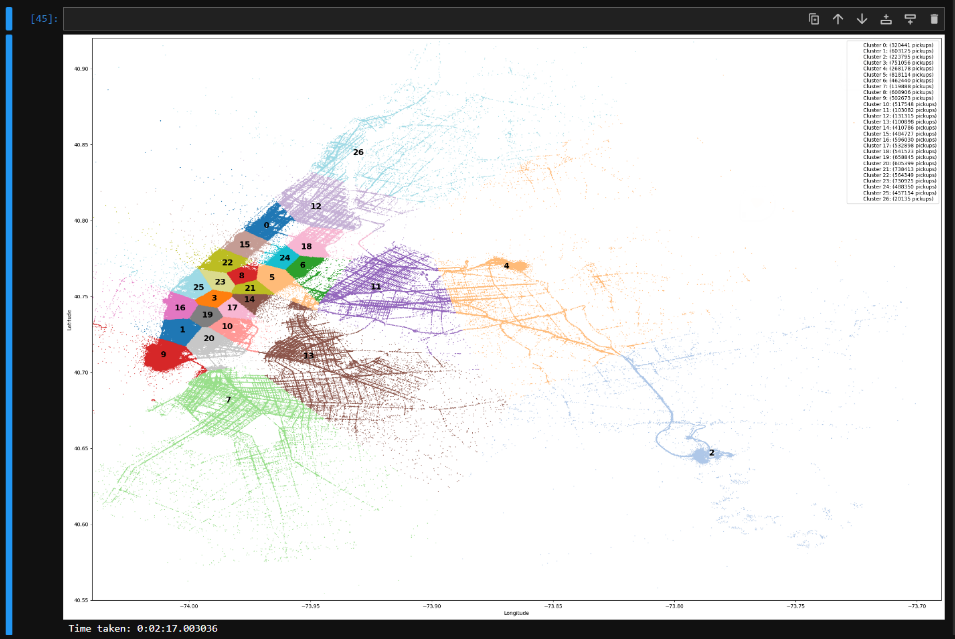

##### Not able to seperate some high density regions like airport at 2 and region at 4

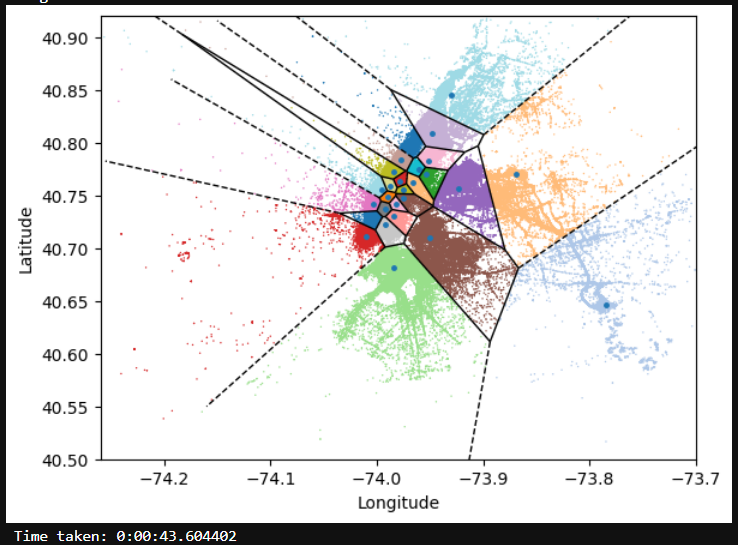

## KMeans with 48 clusters

In [150]:
kmeans_48 = MiniBatchKMeans(n_clusters=48, batch_size=10000, random_state=10, n_init = 5).fit(location)
cluster_centres_48 = kmeans_48.cluster_centers_
pickup_clusters_48 = kmeans_48.predict(trips_new[['pickup_latitude', 'pickup_longitude']])

In [151]:
len(pickup_clusters_48)

10609369

In [152]:
labels_48 = [f"Cluster {cluster_num_48}: ({np.sum(pickup_clusters_48 == cluster_num_48)} pickups)" for cluster_num_48 in range(len(cluster_centres_48))]

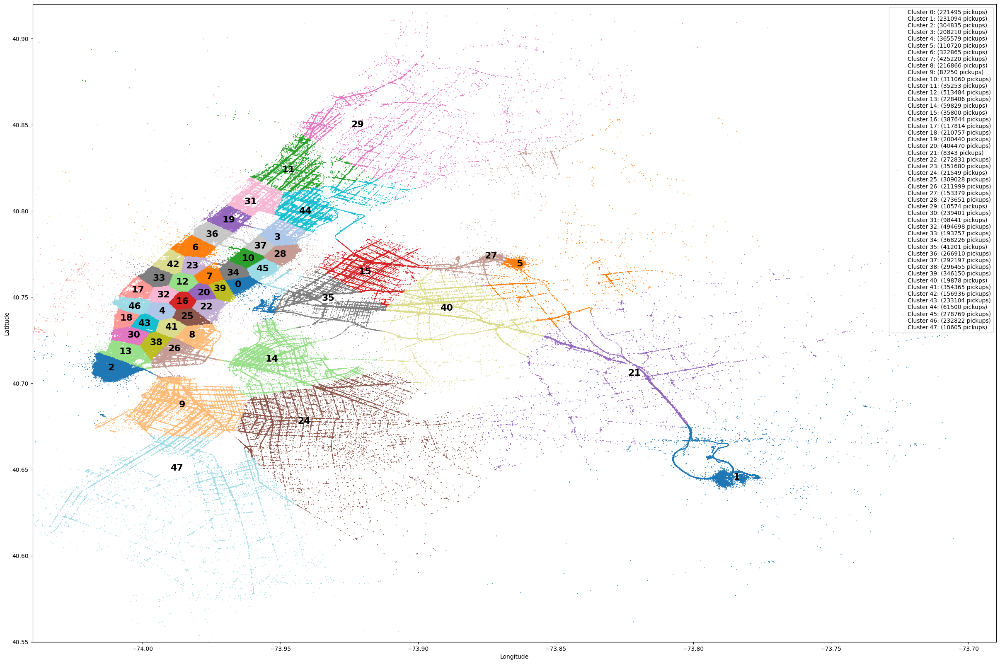

Time taken: 0:02:35.645544


In [71]:
# from scipy.spatial import Voronoi, voronoi_plot_2d 
start = datetime.now()

plt.figure(figsize=(30,20))
# city_long_border = (-74.26, -73.7)
# city_lat_border = (40.5, 40.92)

#without staten island
city_long_border = (-74.04, -73.69)
city_lat_border = (40.55, 40.92)

# vor = Voronoi(cluster_centres[:, ::-1]) 
# voronoi_plot_2d(vor, show_vertices=False, line_alpha=1, point_size=0) 
# plt.scatter(cluster_centres[:, 1], cluster_centres[:, 0], s=5, label = '\n'.join(labels), marker='X') 
plt.scatter(trips_new['pickup_longitude'], trips_new['pickup_latitude'], s=2, lw=0,
          c=pickup_clusters_48, cmap='tab20', alpha=1, label = '\n'.join(labels_48))
for cluster_num_48, centroid_48 in enumerate(cluster_centres_48):
    plt.text(centroid_48[1], centroid_48[0], str(cluster_num_48), color='black', fontsize=16, ha = 'center', va = 'center', weight='bold')

# legend_labels = [f"Cluster {cluster_num} ({np.sum(pickup_clusters == cluster_num)} points)" for cluster_num in range(len(cluster_centres))]
# plt.legend(label = labels, loc='upper right')
# plt.legend(labels = labels)
plt.legend(loc="upper right")
plt.xlim(city_long_border)
plt.ylim(city_lat_border)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.savefig('output_plot_48_2016_JAN.png', dpi=100)

plt.show()
print("Time taken: {}".format(datetime.now()-start))



The downtown area has small regions, it makes sense as we have a high density of pickups there and since the traffic is higher over there,
it makes sense to have smaller regions so that the cab driver can arrive within a standard time period of 10 minutes.
<br>
The high density regions have been segregated properly

<Figure size 3000x1200 with 0 Axes>

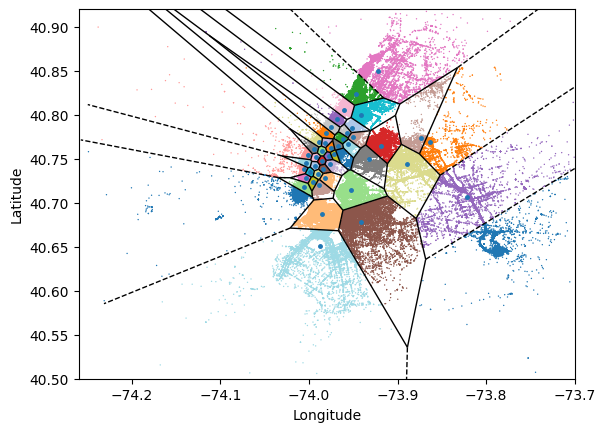

Time taken: 0:00:46.807682


In [73]:
from scipy.spatial import Voronoi, voronoi_plot_2d 
start = datetime.now()

plt.figure(figsize=(30,12))
# Coordinates including staten island
city_long_border = (-74.26, -73.7)
city_lat_border = (40.5, 40.92)

# coordinates without staten island
# city_long_border = (-74.04, -73.698)
# city_lat_border = (40.5, 40.92)

vor = Voronoi(cluster_centres_48[:, ::-1]) 
voronoi_plot_2d(vor, show_vertices=False, line_alpha=1, point_size=5, line_colors='black') 
plt.scatter(cluster_centres_48[:, 0], cluster_centres_48[:, 1], s=5, c='red') 
plt.scatter(trips_new['pickup_longitude'], trips_new['pickup_latitude'], s=1, lw=0,
          c=pickup_clusters_48, cmap='tab20', alpha=1)
# for cluster_num, centroid in enumerate(cluster_centres):
    # plt.text(centroid[1], centroid[0], str(cluster_num), color='black', fontsize=6, weight='bold', ha = 'center', va = 'center')
plt.xlim(city_long_border)
plt.ylim(city_lat_border)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()
print("Time taken: {}".format(datetime.now()-start))

In [153]:
# Observation- The defining of NYC using bounding box is not accurate
# need to find a better method to deal with it

### Creating Time Interval
#### (Recall: the idea is to use previous time intervals to predict the demand in the next time interval in particular regions)

In [75]:
trips_new.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
5,2,2016-01-01 00:00:00,2016-01-01 00:18:30,2,5.52,-73.980118,40.743050,1,N,-73.913490,40.763142,2,19.0,0.5,0.5,0.0,0.0,0.3,20.3,18.50
6,2,2016-01-01 00:00:00,2016-01-01 00:26:45,2,7.45,-73.994057,40.719990,1,N,-73.966362,40.789871,2,26.0,0.5,0.5,0.0,0.0,0.3,27.3,26.75
7,1,2016-01-01 00:00:01,2016-01-01 00:11:55,1,1.20,-73.979424,40.744614,1,N,-73.992035,40.753944,2,9.0,0.5,0.5,0.0,0.0,0.3,10.3,11.90
8,1,2016-01-01 00:00:02,2016-01-01 00:11:14,1,6.00,-73.947151,40.791046,1,N,-73.920769,40.865578,2,18.0,0.5,0.5,0.0,0.0,0.3,19.3,11.20
9,2,2016-01-01 00:00:02,2016-01-01 00:11:08,1,3.21,-73.998344,40.723896,1,N,-73.995850,40.688400,2,11.5,0.5,0.5,0.0,0.0,0.3,12.8,11.10


In [154]:
# time since start of the first trip(which is Jan 1 2016, 0000 hrs), dividing it by 60 for min and then by 10 to create 10 min bins
time_bins = ((pd.to_datetime(trips_new['tpep_pickup_datetime'], format = "%Y-%m-%d %H:%M:%S") - datetime(2016, 1, 1, 0, 0, 0)).dt.total_seconds()/600).astype(int)
trips_new['time_bin'] = time_bins
trips_new['pickup_region'] = pickup_clusters_48

Now with any region id, 10-min time bin, we can predict the number of pickups

In [155]:
trips_new.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,...,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration,time_bin,pickup_region
5,2,2016-01-01 00:00:00,2016-01-01 00:18:30,2,5.52,-73.980118,40.743050,1,N,-73.913490,...,19.0,0.5,0.5,0.0,0.0,0.3,20.3,18.50,0,42
6,2,2016-01-01 00:00:00,2016-01-01 00:26:45,2,7.45,-73.994057,40.719990,1,N,-73.966362,...,26.0,0.5,0.5,0.0,0.0,0.3,27.3,26.75,0,26
7,1,2016-01-01 00:00:01,2016-01-01 00:11:55,1,1.20,-73.979424,40.744614,1,N,-73.992035,...,9.0,0.5,0.5,0.0,0.0,0.3,10.3,11.90,0,42
8,1,2016-01-01 00:00:02,2016-01-01 00:11:14,1,6.00,-73.947151,40.791046,1,N,-73.920769,...,18.0,0.5,0.5,0.0,0.0,0.3,19.3,11.20,0,18
9,2,2016-01-01 00:00:02,2016-01-01 00:11:08,1,3.21,-73.998344,40.723896,1,N,-73.995850,...,11.5,0.5,0.5,0.0,0.0,0.3,12.8,11.10,0,26


In [156]:
len(trips_new[trips_new['pickup_region'] == 1])

95931

In [158]:
# Pickups_region_bin.to_csv('NYC_JAN-FEB_16(1).csv', index=False)
Pickups_region_bin = pd.read_csv('NYC_JAN-FEB_16(1).csv')

In [159]:
# Number of pickups in each 10 minute time interval corresponding to different pickup regions
Pickups_region_bin = trips_new.groupby(['pickup_region','time_bin']).size().reset_index(name='pickup_count')
Pickups_region_bin.head()

,pickup_region,time_bin,pickup_count
0,0,0,68
1,0,1,178
2,0,2,157
3,0,3,130
4,0,4,167


In [162]:
print("Frequency for no. of pickups < 5 for different regions in each 10 min time interval: {}".format(np.sum(Pickups_region_bin['pickup_count'] < 5)))
print("Frequency for 10 min time bins with Zero pickups: {}".format(48*4464 - len(Pickups_region_bin)))

Frequency for no. of pickups < 5 for different regions in each 10 min time interval: 24073
Frequency for 10 min time bins with Zero pickups: 8243


## Handling missing values

In [163]:
print("Total number of 10-min bins is {}".format(int((31*24*60)/10)))

Total number of 10-min bins is 4464


In [165]:
region0 = trips_new[trips_new['pickup_region'] == 0]
len(set(region0['time_bin'])) 
# This means that there are 86 10-min bins where we dont have any pickups for region "0"

4378

#### Checking for 0 pickups in each 10 min time interval for each region

In [166]:
def empty_bins(data):
    d = {"Region": [], "# of 10-min empty bins": []}
    for i in range(48):
        regionI = data[data['pickup_region'] == i]
        d["# of 10-min empty bins"].append(4464 - len(set(regionI['time_bin'])))
        d['Region'].append(i)
    return pd.DataFrame(d)

In [167]:
empty_10min_bins = empty_bins(trips_new)
empty_10min_bins.head()

,Region,# of 10-min empty bins
0,0,86
1,1,580
2,2,72
3,3,116
4,4,118


We have a lot of empty time bins, need to take care of it
<br>
One approach will be to do imputation using moving averages smoothing technique(which includes trailing and centred MA)
<br>
Before smoothing, since we dont have data for empty 10-min time bins, we need to fill these with 0.
<br>
For 2016 February test data, we will fill the empty 10-min time bins with 0

#### Filling the missing data with 0

In [169]:
# Filling the missing data with 0
def filling_empty_timebins(data, pickup_counts):
    imputed_regions = []
    k = 0
    for i in range(48):
        # list of unique time bins for each pickup region
        a = list(set(data[data['pickup_region'] == i]['time_bin']))
        imputed_bins = []
        for j in range(4464):
            if j in a:
                imputed_bins.append(pickup_counts[k])
                k += 1
            else:
                imputed_bins.append(0)
        imputed_regions.append(imputed_bins)
    return imputed_regions
Filled_timebins_JAN_2016 = filling_empty_timebins(trips_new, Pickups_region_bin['pickup_count'])  # list of list-> list1-> 48 regions; list2-> pickups in each 10 min time interval

In [170]:
# Jan 1 2016 is friday.
b = pd.DataFrame(pd.DataFrame(Filled_timebins_JAN_2016).transpose().sum(axis=1), columns= ['pickup_counts'])
b["day of week"] = [((i//144)%7+5)%7 for i in range(4464)]
# 144 10 min time bins in 1 day; //144 to get individual day intervals, %7to get days, +5 because the month started with friday
b1 = b.groupby(['day of week']).sum().reset_index()
b1

,day of week,pickup_counts
0,0,1513186
1,1,1245826
2,2,1383553
3,3,1445066
4,4,1502462
5,5,1918739
6,6,1600537


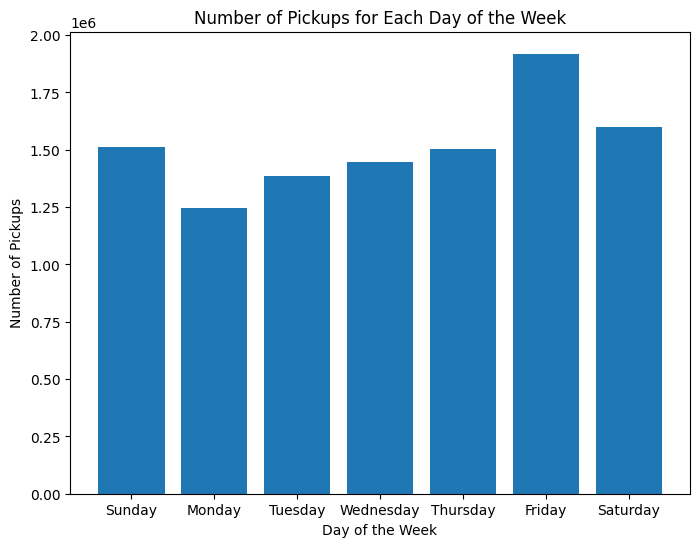

In [172]:
# a.groupby('day of week').size().reset_index()
plt.figure(figsize=(8,6))
plt.bar(b1['day of week'], b1['pickup_counts'])
plt.xlabel('Day of the Week')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups for Each Day of the Week')
plt.xticks(a1['day of week'], ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()

Friday seems to have the highest demand followed by the weekends probably to let off some stress(People going outside)

In [111]:
a = pd.DataFrame(Filled_timebins_JAN_2016)

In [88]:
# zero_pickup_time_bins_regions = []
# pickup_counts_10pm_6am = []
# for i in range(48):
#     b = np.where(a[i] == 0)# indices of time bins of individual region when had 0 pickups
#     c = np.where(a[i] != 0)
#     pickup_counts_10pm_6am.append([(i/6)%24 for i in c[0]])
#     zero_pickup_time_bins_regions.append([(i/6)%24 for i in b[0]])

# # len([j for j in zero_pickup_time_bins if j<=6 or j>=22])/len(zero_pickup_time_bins)*100

# c = {"Region": [], "#Zero_timebins_10pm_6am": [], "Total_zero_timebins": [], "%age of zero_timebins": [], "Total_pickups_10pm_6am": [],
#     "Total_pickups": []}
# for i in range(48):
#     c['Region'].append(i)
#     # c["%age of zero_timebins"].append(f"{(len([j for j in zero_pickup_time_bins_regions[i] if j<=6 or j>=22])/len(zero_pickup_time_bins_regions[i]))*100}")
#     c["%age of zero_timebins"].append(len([j for j in zero_pickup_time_bins_regions[i] if j<=6 or j>=22])/len(zero_pickup_time_bins_regions[i])*100)
#     c['#Zero_timebins_10pm_6am'].append(len([j for j in zero_pickup_time_bins_regions[i] if j<=6 or j>=22]))
#     c['Total_zero_timebins'].append(len(zero_pickup_time_bins_regions[i]))
#     c['Total_pickups_10pm_6am'].append(len([j for j in pickup_counts_10pm_6am[i] if j<=6 or j>=22]))
#     c['Total_pickups'].append(len(pickup_counts_10pm_6am[i]))
# zero_pickup_regions = pd.DataFrame(c)

# 	# Region	#Zero_timebins_10pm_6am	Total_zero_timebins	%age of zero_timebins	Total_pickups_10pm_6am	Total_pickups
# 0	0	              46	83	55.421687	1473	4381
# 1	1	140	183	76.502732	1379	4281
# 2	2	49	96	51.041667	1470	4368
# 3	3	55	85	64.705882	1464	4379

### Imputation of null values

In [173]:
# idea: a x1 x2 b -> all the values will be replaced by mean((a+b+x1+x2)/4); x1 a -> (x1+a)/2 ; a x1 -> (x1+a)/2
# 3 boundary conditions 0 values in between; at start; at teh end
# The idea is to distribute the pickups as mostly 0 pickups will be found during midnight.
def null_imputation(pickup_count, time_bins):
    imputed_regions = [] # stores list of final imputed values of each region
    k = 0 # counter variable to store each pickup_counts
    repeat = 0 # To check if a value is already visited or not
    imputed_value = 0
    for i in range(48): # traversing through 48 regions
        imputed_bins = [] # stores the final pickup values
        repeat = 0
        for j in range(4464):
            if repeat != 0: # prevents iteration for a value which is already visited
                repeat -= 1
                continue
            if j in time_bins[i]: # checking if the time bins exist or not
                imputed_bins.append(pickup_count[k]) # appends the #pickups if the time bin exist
            else:
                if i == 0: # Case: when the initial values are null or no right limit
                    limit = 0 
                    for l in range(j, 4464): # to check until when we have the null values
                        if l not in time_bins[i]:
                            continue
                        else:
                            limit = l
                            break
                    imputed_value = pickup_count[k]/((limit-j)+1)
                    for l in range(j, limit+1):
                        imputed_bins.append(math.ceil(imputed_value))
                    repeat = limit - j
                else:
                    limit = 0
                    for l in range(j, 4464):
                        if l not in time_bins[i]:
                            continue
                        else:
                            limit = l
                            break
                    if limit == 0: # When the end time bins have null values
                        imputed_value = pickup_count[k-1]/((4463-j)+2)
                        for l in range(j, 4464):
                            imputed_bins.append(math.ceil(imputed_value))
                        imputed_bins[j-1] = math.ceil(imputed_value) # updating the pickup count using which redistribution of pickups happened
                        repeat = 4463-j
                        k -= 1
                    else: # Having missing values in between two known values
                        imputed_value = (pickup_count[k-1]+pickup_count[k])*1.0/((limit-j)+2)
                        for l in range(j, limit+1):
                            imputed_bins.append(math.ceil(imputed_value))
                        imputed_bins[j-1] = math.ceil(imputed_value)
                        repeat = limit - j
            k += 1
        imputed_regions.append(imputed_bins)
    return imputed_regions

In [174]:
pickup_time_bins = [] # list of pickup time bins for each region
for i in range(48):
    a = list(set(trips_new[trips_new['pickup_region'] == i]['time_bin']))
    pickup_time_bins.append(a)

In [175]:
Imputed_timebins_JAN_2016 = null_imputation(Pickups_region_bin['pickup_count'], pickup_time_bins)

In [94]:
# r = []
# for i in range(48):
#     a = list(set(trips_new[trips_new['pickup_region'] == i]['pickup_bin']))
#     r.append(a)
# l = smoothing(Pickups_region_bin['pickup_count'],r)
# len(Pickups_region_bin[Pickups_region_bin['pickup_region'] == 0]['pickup_bin'])
# len(l)

In [176]:
# checking for imputation
np.sum([len(i)==4464 for i in Imputed_timebins_JAN_2016]) 

48

## #Preprocessing of prediction data

In [177]:
trips_dd_FEB_2016 = dd.read_csv('yellow_tripdata_2016-02.csv', dtype={'tip_amount': 'float64', 'tolls_amount': 'float64'})

In [97]:
print(trips_dd_FEB_2016.info())

<class 'dask.dataframe.core.DataFrame'>
Columns: 19 entries, VendorID to total_amount
dtypes: float64(12), int64(4), string(3)None


In [98]:
trips_dd_FEB_2016.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2016-02-25 17:24:20,2016-02-25 17:27:20,2,0.70,-73.947250,40.763771,1,N,-73.992012,40.735390,2,5.0,0.0,0.5,0.0,0.0,0.3,5.8
1,2,2016-02-25 23:10:50,2016-02-25 23:31:50,2,5.52,-73.983017,40.750992,1,N,-73.988586,40.758839,2,20.0,0.5,0.5,0.0,0.0,0.3,21.3
2,2,2016-02-01 00:00:01,2016-02-01 00:10:52,6,1.99,-73.992340,40.758202,1,N,-73.964355,40.757977,1,9.5,0.5,0.5,0.7,0.0,0.3,11.5
3,1,2016-02-01 00:00:04,2016-02-01 00:05:16,1,1.50,-73.981453,40.749722,1,N,-73.982323,40.763985,2,6.5,0.5,0.5,0.0,0.0,0.3,7.8
4,2,2016-02-01 00:00:05,2016-02-01 00:20:59,1,5.60,-74.000603,40.729755,1,N,-73.951324,40.669834,1,20.0,0.5,0.5,4.0,0.0,0.3,25.3


In [22]:
trips_dd_FEB_2016.compute().dtypes

VendorID                           int64
tpep_pickup_datetime     string[pyarrow]
tpep_dropoff_datetime    string[pyarrow]
passenger_count                    int64
trip_distance                    float64
pickup_longitude                 float64
pickup_latitude                  float64
RatecodeID                         int64
store_and_fwd_flag       string[pyarrow]
dropoff_longitude                float64
dropoff_latitude                 float64
payment_type                       int64
fare_amount                      float64
extra                            float64
mta_tax                          float64
tip_amount                       float64
tolls_amount                     float64
improvement_surcharge            float64
total_amount                     float64
dtype: object

In [178]:
start = datetime.now()
# converting pickup and dropoff time to datetime object
trips_dd_FEB_2016['tpep_dropoff_datetime'] = dd.to_datetime(trips_dd_FEB_2016['tpep_dropoff_datetime'], format = "%Y-%m-%d %H:%M:%S")
trips_dd_FEB_2016['tpep_pickup_datetime'] = dd.to_datetime(trips_dd_FEB_2016['tpep_pickup_datetime'], format = "%Y-%m-%d %H:%M:%S")

trip_time_FEB_2016 = ((trips_dd_FEB_2016['tpep_dropoff_datetime'] - trips_dd_FEB_2016['tpep_pickup_datetime']).dt.total_seconds()/60).compute()
trips_dd1_FEB_2016 = trips_dd_FEB_2016.compute()
trips_dd1_FEB_2016['trip_duration'] = trip_time_FEB_2016
print("{}".format(datetime.now()-start))
trips_new_FEB_2016 = trips_dd1_FEB_2016.copy()

0:02:38.843750


In [179]:
total_records_2016 = trips_new_FEB_2016.shape[0]
# Pickup and dropoff coordinates
trips_new_FEB_2016 = trips_new_FEB_2016[(trips_new_FEB_2016['pickup_latitude'] >= 40.4774) & (trips_new_FEB_2016['pickup_latitude'] <= 40.9176) &
                     (trips_new_FEB_2016['pickup_longitude'] >= -74.2591) & (trips_new_FEB_2016['pickup_longitude'] <= -73.7002) &
                     (trips_new_FEB_2016['dropoff_latitude'] >= 40.4774) & (trips_new_FEB_2016['dropoff_latitude'] <= 40.9176) &
                     (trips_new_FEB_2016['dropoff_longitude'] >= -74.2591) & (trips_new_FEB_2016['dropoff_longitude'] <= -73.7002)]

trips_new_FEB_2016 = trips_new_FEB_2016[(trips_new_FEB_2016['trip_duration'] > 1) & (trips_new_FEB_2016['trip_duration'] < 600)]

trips_new_FEB_2016 = trips_new_FEB_2016[(trips_new_FEB_2016['trip_distance']>0) & (trips_new_FEB_2016['trip_distance']<28)]

trips_new_FEB_2016 = trips_new_FEB_2016[(trips_new_FEB_2016['total_amount'] > 3) & (trips_new_FEB_2016['total_amount'] < 100)]

print("Number of records removed: {}".format(total_records_2016 - trips_new_FEB_2016.shape[0]))

Number of records removed: 308939


In [180]:
location_2016 = trips_new_FEB_2016[['pickup_latitude', 'pickup_longitude']]

In [181]:
kmeans_48_FEB_2016 = MiniBatchKMeans(n_clusters=48, batch_size=10000, random_state=10, n_init = 5).fit(location_2016)
cluster_centres_48_FEB_2016 = kmeans_48_FEB_2016.cluster_centers_
pickup_clusters_48_FEB_2016 = kmeans_48.predict(trips_new_FEB_2016[['pickup_latitude', 'pickup_longitude']])
# pickup_clusters_48_2016 = kmeans_48_2016.predict(trips_new_FEB_2016[['pickup_latitude', 'pickup_longitude']])

### Imp note
##### The regions might differ in case of both data after clustering. How about using the cluster centres of jan 2016 for Feb 2016??????????
##### How about using jan 2016 kmeans model to assign the pickup regions for feb 2016??? In this way the defined regions will be the same for both years
##### pickup_clusters_48_2016 = kmeans_48.predict(trips_new_FEB_2016[['pickup_latitude', 'pickup_longitude']])


<Figure size 3000x1200 with 0 Axes>

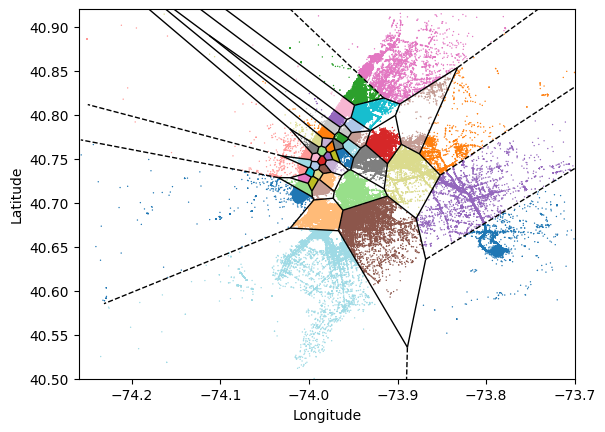

In [88]:
from scipy.spatial import Voronoi, voronoi_plot_2d 

plt.figure(figsize=(30,12))
# Coordinates including staten island
city_long_border = (-74.26, -73.7)
city_lat_border = (40.5, 40.92)

vor = Voronoi(cluster_centres_48[:, ::-1]) 
voronoi_plot_2d(vor, show_vertices=False, line_alpha=1, point_size=0, line_colors='black') 
plt.scatter(trips_new_FEB_2016['pickup_longitude'], trips_new_FEB_2016['pickup_latitude'], s=1, lw=0,
          c=pickup_clusters_48_FEB_2016, cmap='tab20', alpha=1)
plt.xlim(city_long_border)
plt.ylim(city_lat_border)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [183]:
# Creating 10 min time bins on the 

time_bins_FEB_2016 = ((pd.to_datetime(trips_new_FEB_2016['tpep_pickup_datetime'], format = "%Y-%m-%d %H:%M:%S") - datetime(2016, 2, 1, 0, 0, 0)).dt.total_seconds()/600).astype(int)
trips_new_FEB_2016['time_bin'] = time_bins_FEB_2016
trips_new_FEB_2016['pickup_region'] = pickup_clusters_48_FEB_2016

In [188]:
trips_new_FEB_2016.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,...,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration,time_bin,pickup_region
0,2,2016-02-25 17:24:20,2016-02-25 17:27:20,2,0.70,-73.947250,40.763771,1,N,-73.992012,...,5.0,0.0,0.5,0.0,0.0,0.3,5.8,3.00,3560,12
1,2,2016-02-25 23:10:50,2016-02-25 23:31:50,2,5.52,-73.983017,40.750992,1,N,-73.988586,...,20.0,0.5,0.5,0.0,0.0,0.3,21.3,21.00,3595,17
2,2,2016-02-01 00:00:01,2016-02-01 00:10:52,6,1.99,-73.992340,40.758202,1,N,-73.964355,...,9.5,0.5,0.5,0.7,0.0,0.3,11.5,10.85,0,29
3,1,2016-02-01 00:00:04,2016-02-01 00:05:16,1,1.50,-73.981453,40.749722,1,N,-73.982323,...,6.5,0.5,0.5,0.0,0.0,0.3,7.8,5.20,0,42
4,2,2016-02-01 00:00:05,2016-02-01 00:20:59,1,5.60,-74.000603,40.729755,1,N,-73.951324,...,20.0,0.5,0.5,4.0,0.0,0.3,25.3,20.90,0,11


In [189]:
# Number of pickups in each 10 minute time interval corresponding to different pickup regions
Pickups_region_bin_FEB_2016 = trips_new_FEB_2016.groupby(['pickup_region','time_bin']).size().reset_index(name='pickup_count')
Pickups_region_bin_FEB_2016.head()

,pickup_region,time_bin,pickup_count
0,0,0,42
1,0,1,36
2,0,2,31
3,0,3,38
4,0,4,34


In [211]:
29*144

4176

### Treating missing values

In [220]:
print("Number of 10-min time bins in february: {}".format(29*24*6))

Number of 10-min time bins in february: 4176


In [221]:
def filling_empty_timebins_FEB(data, pickup_counts):
    imputed_regions = []
    k = 0
    for i in range(48):
        # list of unique time bins for each pickup region
        a = list(set(data[data['pickup_region'] == i]['time_bin']))
        imputed_bins = []
        for j in range(4176):
            if j in a:
                imputed_bins.append(pickup_counts[k])
                k += 1
            else:
                imputed_bins.append(0)
        imputed_regions.append(imputed_bins)
    return imputed_regions

In [222]:
# Filling the missing data with 0
Filled_timebins_FEB_2016 = filling_empty_timebins_FEB(trips_new_FEB_2016, Pickups_region_bin_FEB_2016['pickup_count'])

In [223]:
# np.sum([1 for i in [len(i) for i in Filled_timebins_FEB_2016] if i == 4176])
# # 48

In [224]:
pickup_time_bins_FEB_2016 = [] # list of pickup time bins for each region
for i in range(48):
    a = list(set(trips_new_FEB_2016[trips_new_FEB_2016['pickup_region'] == i]['time_bin']))
    pickup_time_bins_FEB_2016.append(a)

In [225]:
def null_imputation_FEB_2016(pickup_count, time_bins):
    imputed_regions = [] # stores list of final imputed values of each region
    k = 0 # counter variable to store each pickup_counts
    repeat = 0 # To check if a value is already visited or not
    imputed_value = 0
    for i in range(48): # traversing through 48 regions
        imputed_bins = [] # stores the final pickup values
        repeat = 0
        for j in range(4176):
            if repeat != 0: # prevents iteration for a value which is already visited
                repeat -= 1
                continue
            if j in time_bins[i]: # checking if the time bins exist or not
                imputed_bins.append(pickup_count[k]) # appends the #pickups if the time bin exist
            else:
                if i == 0: # Case: when the initial values are null or no right limit
                    limit = 0 
                    for l in range(j, 4464): # to check until when we have the null values
                        if l not in time_bins[i]:
                            continue
                        else:
                            limit = l
                            break
                    imputed_value = pickup_count[k]/((limit-j)+1)
                    for l in range(j, limit+1):
                        imputed_bins.append(math.ceil(imputed_value))
                    repeat = limit - j
                else:
                    limit = 0
                    for l in range(j, 4464):
                        if l not in time_bins[i]:
                            continue
                        else:
                            limit = l
                            break
                    if limit == 0: # When the end time bins have null values
                        imputed_value = pickup_count[k-1]/((4463-j)+2)
                        for l in range(j, 4464):
                            imputed_bins.append(math.ceil(imputed_value))
                        imputed_bins[j-1] = math.ceil(imputed_value) # updating the pickup count using which redistribution of pickups happened
                        repeat = 4463-j
                        k -= 1
                    else: # Having missing values in between two known values
                        imputed_value = (pickup_count[k-1]+pickup_count[k])*1.0/((limit-j)+2)
                        for l in range(j, limit+1):
                            imputed_bins.append(math.ceil(imputed_value))
                        imputed_bins[j-1] = math.ceil(imputed_value)
                        repeat = limit - j
            k += 1
        imputed_regions.append(imputed_bins)
    return imputed_regions

In [226]:
Imputed_timebins_FEB_2016 = null_imputation_FEB_2016(Pickups_region_bin_FEB_2016['pickup_count'], pickup_time_bins_FEB_2016)

In [227]:
# Can't use rolling statistics imputation as it doesn’t work well for data with large gaps of missing values, as it would be imputed with NaN values.
# It leverages the temporal structure of the data by replacing missing values with a rolling statistic (like mean, median, or mode) over a defined window period. Most commonly, a rolling mean (or moving average) is used, which takes the average of the previous ’n’ points.

In [242]:
# # Number of 10 min bins with 0 pickups in the february month for the entire NYC
# np.sum(pd.DataFrame(Filled_timebins_FEB_2016).T.sum(axis=1) == 0)
# 0

## Plot for pickups for each 10 min time bin for NYC for JAN 2016

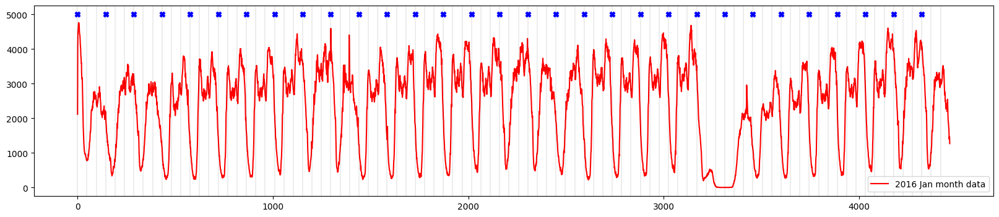

In [243]:
# Timebins_NYC_FEB_2016 = pd.DataFrame(Filled_timebins_FEB_2016).T.sum(axis=1)
# plt.figure(figsize=(20,4))
# plt.plot(range(4176), Timebins_NYC_FEB_2016)
# v_lines_24 = list(range(0,4176,144))
# v_lines_8 = list(range(0,4176,48))
# for i in v_lines_24:
#     # plt.axvline(x=i, color='red', linestyle='-', linewidth = 1)
#     plt.scatter(i,5000, color='blue', marker='X')
# for i in v_lines_8:
#     plt.axvline(x=i, color='black', linestyle='-', linewidth=0.1)
# plt.show()

Timebins_NYC_JAN_2016 = pd.DataFrame(Filled_timebins_JAN_2016).T.sum(axis=1)
plt.figure(figsize=(20,4))
plt.plot(range(4464), Timebins_NYC_JAN_2016, color='red', label='2016 Jan month data')
v_lines_24 = list(range(0,4464,144))
v_lines_8 = list(range(0,4464,48))
for i in v_lines_24:
    # plt.axvline(x=i, color='red', linestyle='-', linewidth = 1)
    plt.scatter(i,5000, color='blue', marker='X')
for i in v_lines_8:
    plt.axvline(x=i, color='black', linestyle='-', linewidth=0.1)
plt.legend()
plt.show()

## Pickups for each 10 min time bin for each region of NYC for JAN 2016

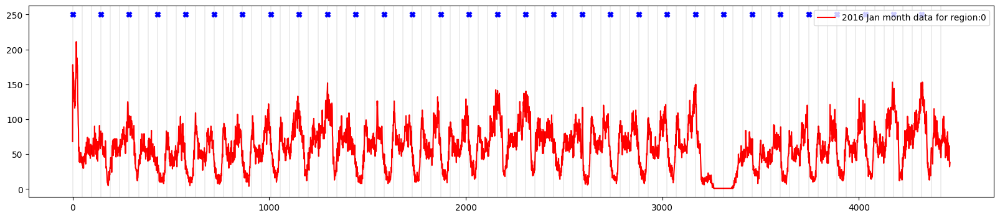

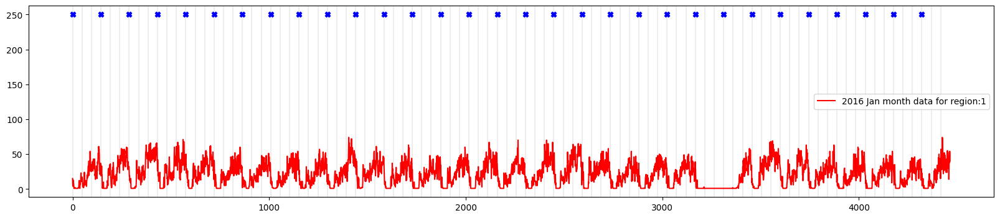

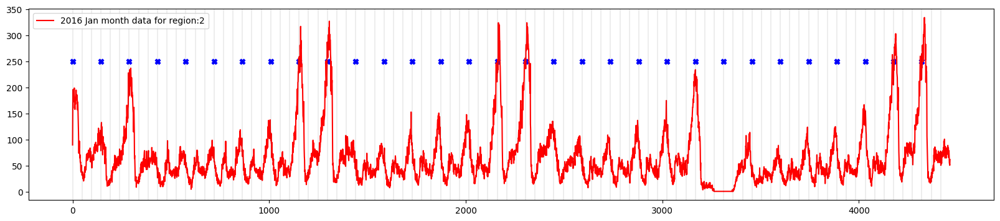

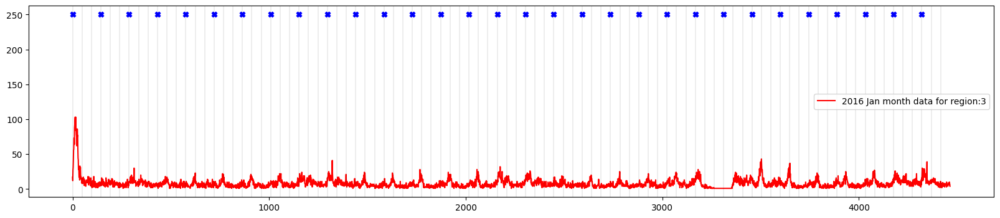

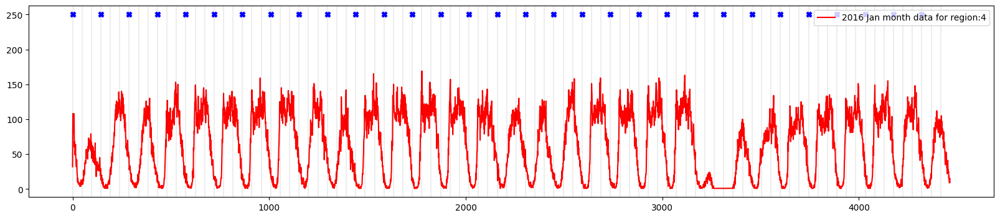

...

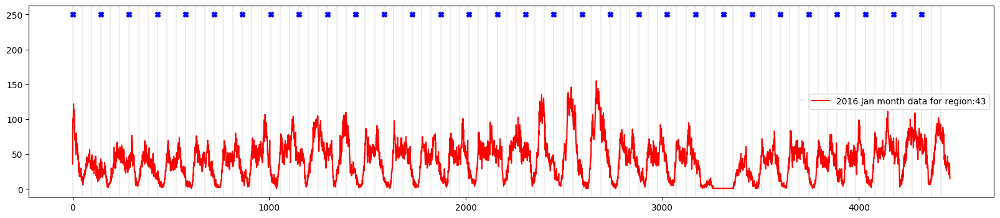

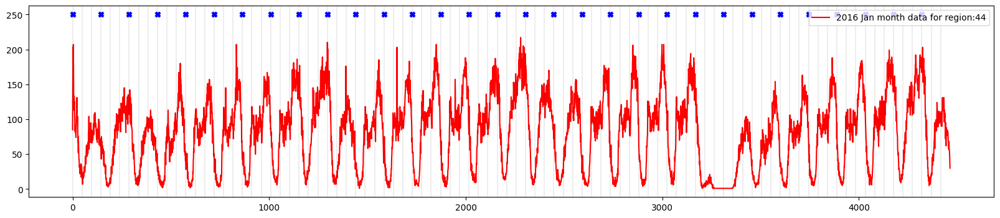

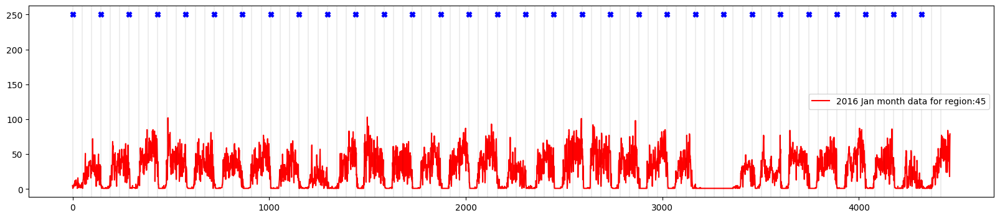

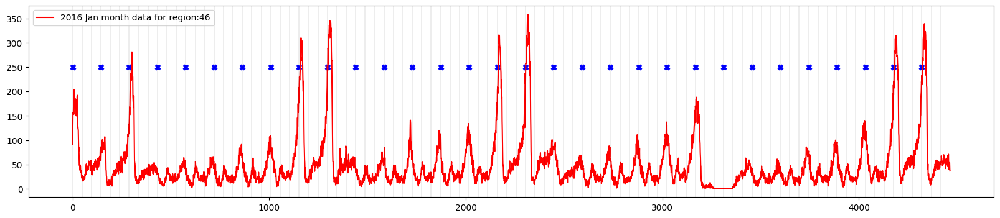

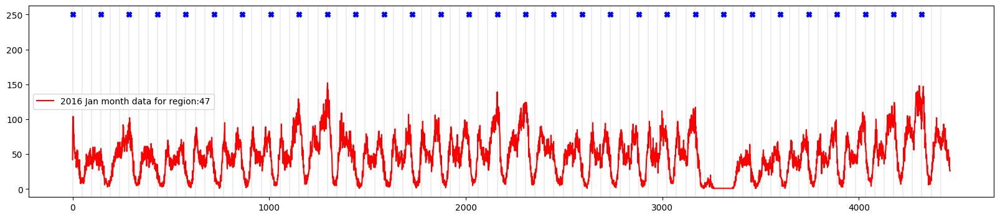

In [244]:
for i in range(48):
    plt.figure(figsize=(20,4))
    # plt.plot(list(range(np.sum(Pickups_region_bin['pickup_region'] == i)))[3740:3760],Pickups_region_bin[Pickups_region_bin['pickup_region'] == i]['pickup_count'][3740:3760], color=uniqueish_color(), label='2015 Jan month data')
    plt.plot(np.where(Imputed_timebins_JAN_2016[i])[0], Imputed_timebins_JAN_2016[i], color='red', label=f'2016 Jan month data for region:{i}')
    v_lines_24 = list(range(0,4464,144))
    v_lines_8 = list(range(0,4464,48))
    for i in v_lines_24:
        # plt.axvline(x=i, color='red', linestyle='-', linewidth = 1)
        plt.scatter(i,250, color='blue', marker='X')
    for i in v_lines_8:
        plt.axvline(x=i, color='black', linestyle='-', linewidth=0.1)
        # plt.scatter(i,100, color='black', marker='X')
    plt.legend()
    plt.show()

Key observations:
<br>
1. There is no trend
2. We can see a seasonality of 1 day
3. From 24-27th Jan, the pickups for most of the regions were very low- probable reasons: protest, construction, weather/calamity??????
   <br>
   The biggest January snowstorm to hit NYC happened just a few years ago, on Jan. 24-26, 2016. 27.5 inches of snow buried NYC. 
Streets in boroughs like Queens remained under feet of snow for several days as the city scrambled to clean up the mes
   <br><br>
https://ny1.com/nyc/all-boroughs/weather/2021/01/08/january-has-a-history-of-big-snowstorms-in-nyc--here-s-a-look-back#:~:text=The%20biggest%20January%20snowstorm%20to,to%20clean%20up%20the%20mess.
<br>s.
5. Regions 6,9,12,16(some big fluctuations),Regions-21,40(vvless),24,27,29,33,34,43 has very less demand(less number of pickups) & rest good demand

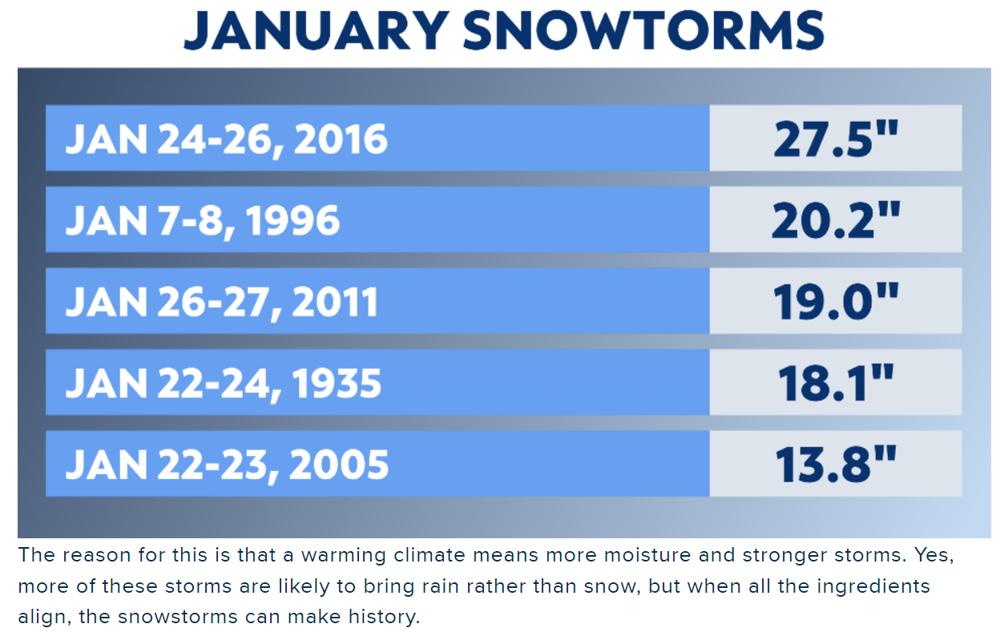

## Testing for stationarity
Ho : Not stationary<br>
Ha : Stationary

### For region 0

In [245]:
timebins = range(4464)
pickup_counts = Imputed_timebins_JAN_2016[0]
data = pd.DataFrame({'pickup_counts': pickup_counts}, index=timebins)

In [246]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(data['pickup_counts'])
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print("#lags used: {}".format(result[2]))
print("#observations used: {}".format(result[3]))
print('Critical Values:')
for key, value in result[4].items():
 print('\t{}: {}'.format(key, value))

ADF Statistic: -11.432511895898712
p-value: 6.464920328801371e-21
#lags used: 24
#observations used: 4439
Critical Values:
	1%: -3.431823999890399
	5%: -2.862191330446143
	10%: -2.5671167070962335


We reject the null hypothesis stating that my data is stationary

In [247]:
# Differencing
# data['Seasonal first difference'] = data['pickup_counts'] - data['pickup_counts'].shift(144)  # 144 bcoz of seasonality of 1 day

### For entire "pickup" series irrespective of regions

In [58]:
# single list containing all the pickups in a 10 min interval in order
Imputed_timebins_JAN_2016_all = [timebins for regions in Imputed_timebins_JAN_2016 for timebins in regions]
timebins_all = range(4464*48) 
pickup_counts_all = Imputed_timebins_JAN_2016_all
data1 = pd.DataFrame({'pickup_counts': pickup_counts_all}, index=timebins_all)

In [59]:
result = adfuller(data1['pickup_counts'])
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print("#lags used: {}".format(result[2]))
print("#observations used: {}".format(result[3]))
print('Critical Values:')
for key, value in result[4].items():
 print('\t{}: {}'.format(key, value))

ADF Statistic: -30.94106544819255
p-value: 0.0
#lags used: 82
#observations used: 214189
Critical Values:
	1%: -3.4303805308786712
	5%: -2.8615534942493244
	10%: -2.5667771825029044


## Decomposition

In [ ]:
# result = seasonal_decompose(data['pickup_counts'], period=144)
# result.plot()

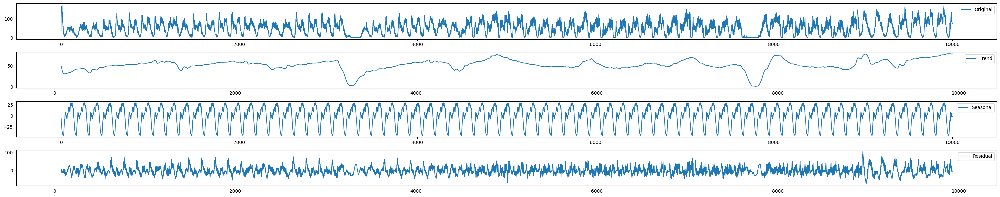

In [63]:
from statsmodels.tsa.seasonal import seasonal_decompose
x = data1[:10000]
result_all = seasonal_decompose(x['pickup_counts'], period=144) # saw a seasonality of 1 day in the previous plots
plt.figure(figsize=(30, 6))
plt.subplot(411)
plt.plot(x.index, x['pickup_counts'], label='Original')
plt.legend()
plt.subplot(412)
plt.plot(result_all.trend, label='Trend')
plt.legend()
plt.subplot(413)
plt.plot(result_all.seasonal, label='Seasonal')
plt.legend()
plt.subplot(414)
plt.plot(result_all.resid, label='Residual')
plt.legend()
plt.tight_layout()
plt.show()

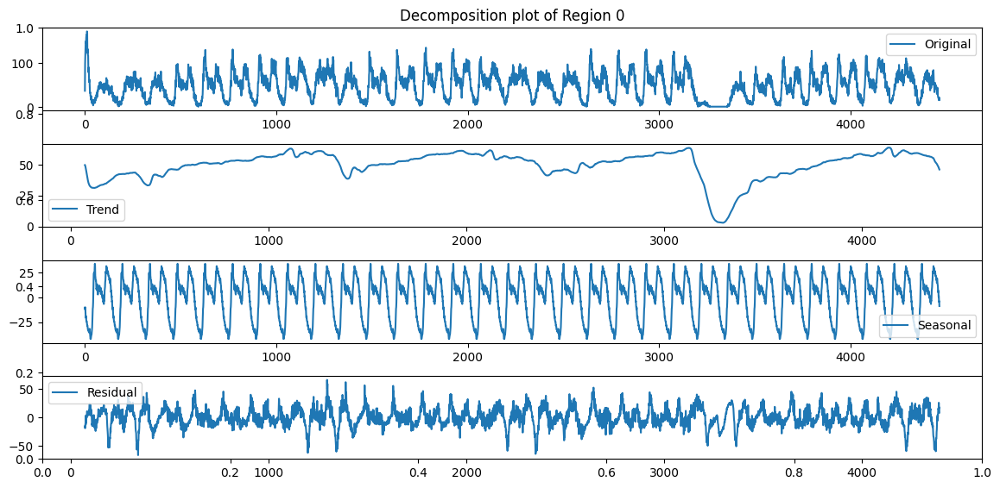

In [64]:
result = seasonal_decompose(data['pickup_counts'], period=144) # saw a seasonality of 1 day in the previous plots
plt.figure(figsize=(12, 6))
plt.title("Decomposition plot of Region 0")
plt.subplot(411)
plt.plot(data.index, data['pickup_counts'], label='Original')
plt.legend()
plt.subplot(412)
plt.plot(result.trend, label='Trend')
plt.legend()
plt.subplot(413)
plt.plot(result.seasonal, label='Seasonal')
plt.legend()
plt.subplot(414)
plt.plot(result.resid, label='Residual')
plt.legend()
plt.tight_layout()
plt.show()

The decomposition shows a strong seasonality of 1 day and there is no particular trend so no need to perform differencing(usually one order or maybe 2)

## Autocorrelation

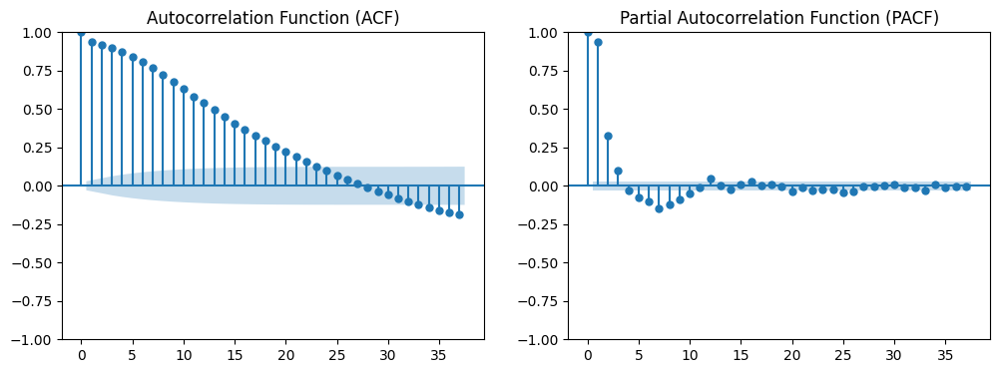

In [65]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# Plot ACF and PACF
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
plot_acf(data['pickup_counts'], ax=ax1)
ax1.set_title('Autocorrelation Function (ACF)')
plot_pacf(data['pickup_counts'], ax=ax2)
ax2.set_title('Partial Autocorrelation Function (PACF)')
plt.show()

Anything beyond the CI shows significant correlation<br>
PACF:- No of terms for AR model will be 1 or 2 or equal to #sig.spikes which is 13.<br>
ACF:- No of terms for MA model could be from 1 to ... with decreasing significance<br>
We have multiple sig. values in case of acf, so using MA model will become complex, can use AR as we have very less sig. values????????????
<br>
 check for pacf and acf ???

# Modelling

### Time Series Models

In [66]:
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [142]:
timebins = range(4176)
pickup_counts = Imputed_timebins_FEB_2016[0]
data_FEB = pd.DataFrame({'pickup_counts': pickup_counts}, index=timebins)

### AutoRegressive model

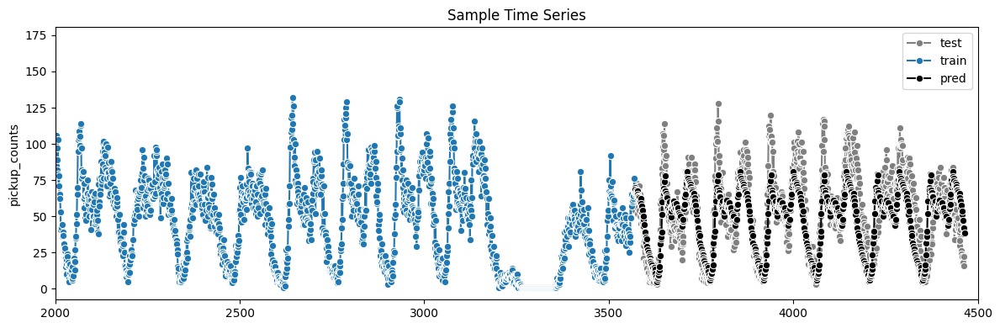

In [67]:
# https://www.statsmodels.org/dev/generated/statsmodels.tsa.ar_model.AutoReg.html
from statsmodels.tsa.ar_model import AutoReg
num_samples = len(data1[:4464])
train_len = int(0.8* len(data1[:4464]))
train = data1['pickup_counts'][:train_len]
ar_model = AutoReg(train, lags=[1,2,3,4,5,6], period=144, seasonal=True).fit()
# AutoReg(data, lags=[11, 12], seasonal=False).fit()

# print(ar_model.summary())
pred = ar_model.predict(start=train_len, end=num_samples, dynamic=True)

f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))
sns.lineplot(x=range(train_len,num_samples), y=data1['pickup_counts'][train_len:num_samples], marker='o', label='test', color='grey')
sns.lineplot(x=range(train_len), y=train, marker='o', label='train')
sns.lineplot(x=range(train_len,num_samples+1), y=pred, marker='o', label='pred', color='black')
ax.set_xlim(2000, 4500)
ax.set_title('Sample Time Series')
plt.tight_layout()
plt.show()

In [68]:
mape = calculate_mape(data1['pickup_counts'][train_len:], pred)
print(f'MAPE: {mape:.2f}%')

MAPE: 39.05%


## Using pmdARIMA(all in one)-takes a lot of time and space

In [ ]:
# https://alkaline-ml.com/pmdarima/tips_and_tricks.html#period
start=datetime.now()
import pmdarima as pm
from pmdarima.model_selection import train_test_split

train, test = train_test_split(data1['pickup_counts'][:4464], train_size=int(0.8* len(data1[:4464])))
model = pm.auto_arima(train, seasonal=True, m=144)
preds = model.predict(test.shape[0])
print(start-datetime.now())

In [ ]:
# plt.plot(data1['pickup_counts'][:int(0.8* len(data1[:200]))], train)
plt.plot(range(1500), data1['pickup_counts'][:1500])
plt.plot(range(int(0.8*(1500)),1500), preds)
plt.show()

In [ ]:
mape = calculate_mape(data1['pickup_counts'][int(0.8* len(data1[:1500])):1500], preds)
print(f'MAPE: {mape:.2f}%')

##  ARIMA model

In [81]:
29*24*6

4176

In [84]:
from statsmodels.tsa.arima.model import ARIMA

from pmdarima.model_selection import train_test_split
train, test = train_test_split(data1['pickup_counts'][:4464], train_size=int(0.8* len(data1[:4464])))

# arima = ARIMA(data['pickup_counts'][:4464], seasonal_order=(3,1,0,144)).fit()
arima = ARIMA(data['pickup_counts'], order=(3,1,0)).fit()
# predictions = arima.predict(start=test.index[0], end=test.index[-1])
predictions = arima.predict(start=0, end=4175)
calculate_mape(Pickups_region_bin_FEB_2016['pickup_count'][:4176], predictions)

74.50283177992985

High error due to seasonality

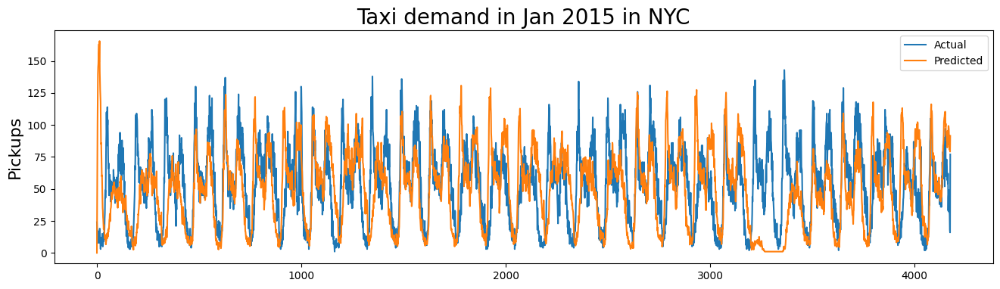

In [86]:
plt.figure(figsize=(16,4))
plt.plot(Pickups_region_bin_FEB_2016['pickup_count'][:4176], label="Actual")
plt.plot(predictions, label="Predicted")
plt.title('Taxi demand in Jan 2015 in NYC', fontsize=20)
plt.ylabel('Pickups', fontsize=16)
plt.legend()

In [87]:
# data1.to_csv('data1.csv', index=False)
# X_final.to_csv('Final_Bone_Marrow.csv', index=False)

## Moving Averages Model

In [ ]:
def calculate_moving_average(data, window_size):
    return data['no_of_pickups'].rolling(window=window_size, min_periods=1).mean()
window_size = 3

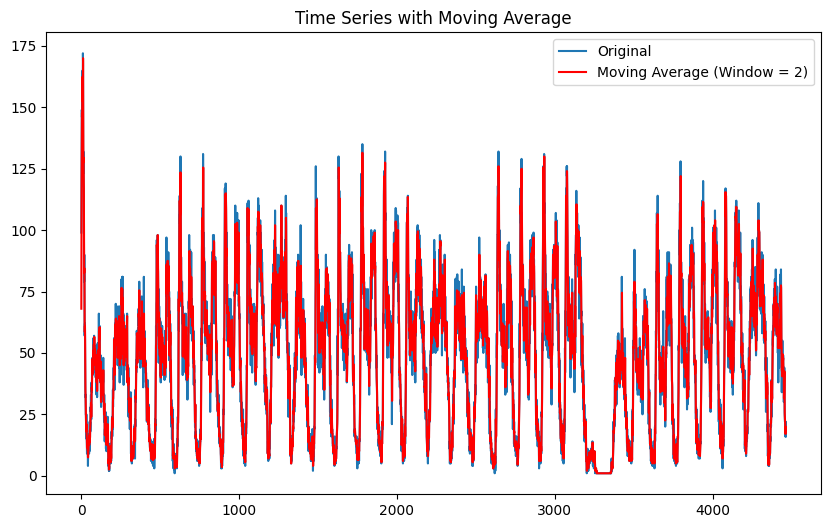

Mean Absolute Percentage Error (MAPE): 10.37%


In [194]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error
data2=data1.copy()
# Assuming df is your time series data with 'index' as the timestamp and 'no_of_pickups' as pickups
data2 = data2[:4464]
# Calculate the moving average
def moving_average(series, window_size):
    return series.rolling(window=window_size).mean()

# Set the window size for the moving average
window_size = 2  # You can adjust this based on your preference

# Create a new column for the moving average
data2['moving_avg'] = moving_average(data2['pickup_counts'], window_size)

# Drop NaN values introduced by the moving average calculation
data2.dropna(inplace=True)

# Plot the original time series and the moving average


plt.figure(figsize=(10, 6))
plt.plot(data2['pickup_counts'], label='Original')
plt.plot(data2['moving_avg'], label=f'Moving Average (Window = {window_size})', color='red')
plt.legend()
plt.title('Time Series with Moving Average')
plt.show()

# Split the data into training and testing sets
train_size = int(len(data2) * 0.8)
train, test = data2[:train_size], data2[train_size:]

# Use the moving average as predictions
predictions = test['moving_avg']

# Evaluate the model using MAPE
mape = calculate_mape(test['pickup_counts'], predictions)
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')


## Exponential Weighted Averages Model

In [120]:
# pred = data['pickup_counts'].ewm(alpha=0.6, adjust=True).mean()
# plt.figure(figsize=(20, 6))
# plt.plot(data['pickup_counts'], label='Original Data')
# plt.plot(pred, label=f'EWMA (alpha={0.3})', color='red')
# plt.title('Exponential Weighted Moving Average (EWMA)')
# plt.xlabel('Time')
# plt.ylabel('Pickup Counts')
# plt.legend()
# plt.show()
# calculate_mape(data['pickup_counts'], pred)
# # 12.005130755735776

19.992834966530186


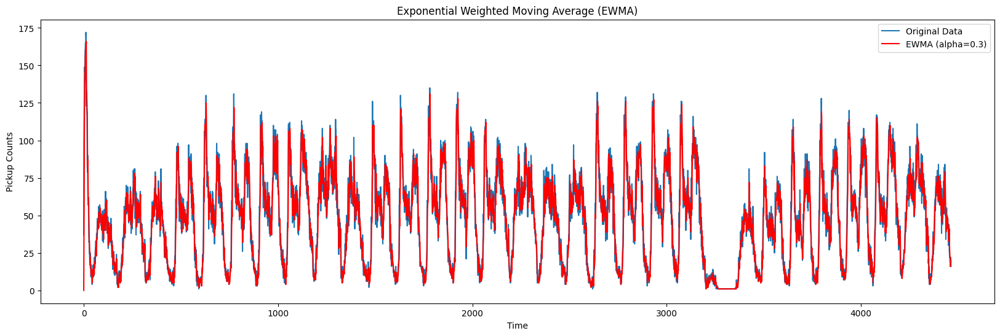

In [116]:
predicted_values=[]
def EWAM(data):
    predicted_value= data[0]
    alpha=0.3
    error=[]
    for i in range(0,4464):
        if i%4464==0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((predicted_value-(data)[i])))
        # print(predicted_value, data[i], i)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(data[i]))
    # mape_err = ((sum(error)/len(error))/(sum(data.values)/len(data.values)))*100
    # mse_err = sum([e**2 for e in error])/len(error)
    # mape_err = calculate_mape(data['pickup_counts'], predicted_values)
    # print(predicted_values)

EWAM(data['pickup_counts'])

# print("The MAPE for EWAM is {:.2f}%".format()
print(calculate_mape(data['pickup_counts'], predicted_values))

plt.figure(figsize=(20, 6))
plt.plot(data['pickup_counts'], label='Original Data')
plt.plot(predicted_values, label=f'EWMA (alpha={0.3})', color='red')
plt.title('Exponential Weighted Moving Average (EWMA)')
plt.xlabel('Time')
plt.ylabel('Pickup Counts')
plt.legend()
plt.show()

The MAPE for EWAM is 19.72%


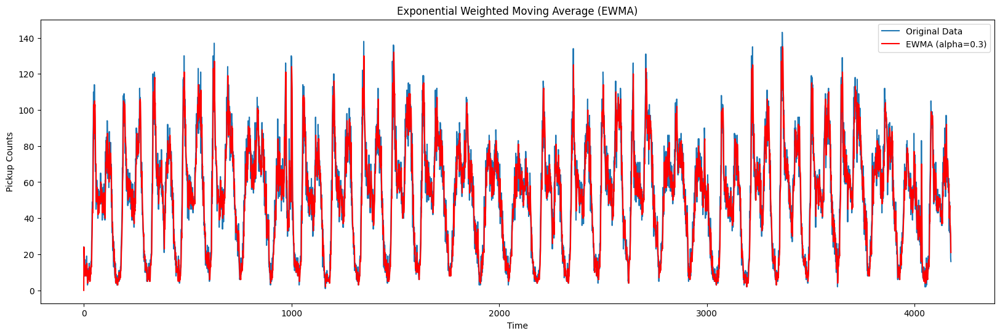

In [263]:
predicted_values_FEB=[]
def EWAM(data):
    predicted_value= data[0]
    alpha=0.3
    error=[]
    for i in range(0,4176):
        if i%4176==0:
            predicted_values_FEB.append(0)
            error.append(0)
            continue
        predicted_values_FEB.append(predicted_value)
        error.append(abs((predicted_value-(data)[i])))
        # print(predicted_value, data[i], i)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(data[i]))
    # mape_err = ((sum(error)/len(error))/(sum(data.values)/len(data.values)))*100
    # print(mape_err)
    

EWAM(data_FEB['pickup_counts'])
print("The MAPE for EWAM is {:.2f}%".format(calculate_mape(data_FEB['pickup_counts'], predicted_values_FEB)))
# print(calculate_mape(data_FEB['pickup_counts'], predicted_values_FEB))

plt.figure(figsize=(20, 6))
plt.plot(data_FEB['pickup_counts'], label='Original Data')
plt.plot(predicted_values_FEB, label=f'EWMA (alpha={0.3})', color='red')
plt.title('Exponential Weighted Moving Average (EWMA)')
plt.xlabel('Time')
plt.ylabel('Pickup Counts')
plt.legend()
plt.show()

## Sarimax

In [105]:
# # Assuming you want to use the last month for testing (adjust as needed)
# start=datetime.now()
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# train_size = int(len(data2) * 0.8)
# train, test = data2[:train_size], data2[train_size:]
# # Fit a SARIMA model
# order = (1, 0, 1)  # Non-seasonal order (p, d, q)
# seasonal_order = (1, 0, 1, 144)  # Seasonal order (P, D, Q, S)

# model = SARIMAX(train['pickup_counts'], order=order, seasonal_order=seasonal_order)
# results = model.fit(disp=False)
# print(datetime.now()-start)

# predictions = results.get_forecast(steps=len(test))
# predicted_counts = predictions.predicted_mean
# plt.figure(figsize=(12, 6))
# plt.plot(train['pickup_counts'], label='Training Data')
# plt.plot(test['pickup_counts'], label='Actual Data')
# plt.plot(test.index, predicted_counts, label='Predicted Data', color='red')
# plt.title('SARIMA Model Forecasting')
# plt.xlabel('Time')
# plt.ylabel('Pickup Counts')
# plt.legend()
# plt.show()

# calculate_mape(test['pickup_counts'], predicted_counts)

# ![image.png](attachment:36572151-fc43-46d6-9151-c54dcc63ac6c.png)

### Modelling

In [127]:
Pickups_region_bin

,pickup_region,time_bin,pickup_count
0,0,0,37
1,0,1,99
2,0,2,114
3,0,3,129
4,0,4,149
...,...,...,...
205484,47,4459,3
205485,47,4460,1
205486,47,4461,1
205487,47,4462,4


In [210]:
# Imputed_timebins_JAN_2016 - contains 48 list, each list contains values that represent the no of pickups that occured in JAN 2016

# No. of pickups that happened in last 5 10-min time intervals
timestamps = 5

# output varaible
# it is list of lists
# it will contain number of pickups (4459) for each cluster
output = []

# 
latitude = []

# 
longitude = []

# sunday = 0, monday=1, tue = 2, wed=3, thur=4, fri=5,sat=6
# for every cluster we will be adding 4459 values, each value represent to which day of the week that pickup bin belongs to
# it is list of lists
weekday = []


# each row corresponds to an entry in out data
# for the first row we will have [f0,f1,f2,f3,f4] fi=number of pickups happened in i+1th 10min intravel(bin)
# the second row will have [f1,f2,f3,f4,f5]
# the third row will have [f2,f3,f4,f5,f6]
# and so on...
feature = []

feature = [0]*timestamps
for i in range(0,48):
    latitude.append([kmeans_48.cluster_centers_[i][0]]*4171)
    longitude.append([kmeans_48.cluster_centers_[i][1]]*4171)
    # feb 1st 2016 is friday, so we start our day from 5: "(int(k/144))%7+5"
    # our prediction start from 5th 10min intravel since we need to have number of pickups that are happened in last 5 pickup bins
    weekday.append([int(((int(k/144))%7+5)%7) for k in range(5,4176)])
    # regions_cum is a list of lists [[x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], .. 40 lsits]
    feature = np.vstack((feature, [Imputed_timebins_FEB_2016[i][r:r+timestamps] for r in range(0,4171)]))
    output.append(Imputed_timebins_FEB_2016[i][5:])
feature = feature[1:] # removing the [00000]

In [212]:
len(latitude[0])*len(latitude) == feature.shape[0] == len(weekday)*len(weekday[0]) == 48*4171 == len(output)*len(output[0])

True

In [213]:
# Getting the predictions of exponential moving averages to be used as a feature in cumulative form

# upto now we computed 8 features for every data point that starts from 50th min of the day
# 1. cluster center lattitude
# 2. cluster center longitude
# 3. day of the week 
# 4. f_t_1: number of pickups that are happened previous t-1th 10min intravel
# 5. f_t_2: number of pickups that are happened previous t-2th 10min intravel
# 6. f_t_3: number of pickups that are happened previous t-3th 10min intravel
# 7. f_t_4: number of pickups that are happened previous t-4th 10min intravel
# 8. f_t_5: number of pickups that are happened previous t-5th 10min intravel

# from the baseline models we said the exponential weighted moving avarage gives us the best error
# we will try to add the same exponential weighted moving avarage at t as a feature to our data
# exponential weighted moving avarage => p'(t) = alpha*p'(t-1) + (1-alpha)*P(t-1) 
alpha=0.3

# it is a temporary array that store exponential weighted moving avarage for each 10min intravel, 
# for each cluster it will get reset
# for every cluster it contains 13104 values
predicted_values=[]

# it is similar like tsne_lat
# it is list of lists
# predict_list is a list of lists [[x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], .. 40 lsits]
predict_list = []
for r in range(0,48):
    for i in range(0,4176):
        if i==0:
            predicted_value= Imputed_timebins_FEB_2016[r][0]
            predicted_values.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(Imputed_timebins_FEB_2016[r][i]))
    predict_list.append(predicted_values[5:])
    predicted_values=[]

In [214]:
# train, test split : 70% 30% split
# Before we start predictions using the tree based regression models we take 3 months of 2016 pickup data 
# and split it such that for every region we have 70% data in train and 30% in test,
# ordered date-wise for every region
print("size of train data :", int(4171*0.7))
print("size of test data :", int(4171*0.3))

size of train data : 2919
size of test data : 1251


In [197]:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# cant use this due to temporal nature of data as the above function induces randomness

In [224]:
# extracting first 2919 timestamp values i.e 70% of 4171 (total timestamps) for our training data
train_features =  [feature[i*4171:(4171*i+2919)] for i in range(0,48)]
# temp = [0]*(12955 - 9068)
test_features = [feature[(4171*(i))+2919:4171*(i+1)] for i in range(0,48)]

In [225]:
train_features

[array([[24, 19, 13, 10,  9],
        [19, 13, 10,  9,  8],
        [13, 10,  9,  8, 17],
        ...,
        [13,  9,  6, 10, 23],
        [ 9,  6, 10, 23, 14],
        [ 6, 10, 23, 14,  8]], dtype=int64),
 array([[77, 69, 71, 58, 59],
        [69, 71, 58, 59, 48],
        [71, 58, 59, 48, 43],
        ...,
        [60, 53, 53, 42, 37],
        [53, 53, 42, 37, 48],
        [53, 42, 37, 48, 37]], dtype=int64),
 array([[22, 16, 47, 18, 10],
        [16, 47, 18, 10, 17],
        [47, 18, 10, 17, 20],
        ...,
        [ 7, 10, 19, 18, 17],
        [10, 19, 18, 17, 16],
        [19, 18, 17, 16, 14]], dtype=int64),
 array([[ 9, 13,  6,  9,  8],
        [13,  6,  9,  8,  8],
        [ 6,  9,  8,  8,  4],
        ...,
        [13, 10, 14, 31, 18],
        [10, 14, 31, 18, 25],
        [14, 31, 18, 25, 15]], dtype=int64),
 array([[20, 37, 25, 38, 31],
        [37, 25, 38, 31, 10],
        [25, 38, 31, 10, 18],
        ...,
        [10, 16,  8, 10,  9],
        [16,  8, 10,  9, 13],
     

In [226]:
# extracting first 2919 timestamp values i.e 70% of 4171 (total timestamps) for our training data
train_lat = [i[:2919] for i in latitude]
train_lon = [i[:2919] for i in longitude]
train_weekday = [i[:2919] for i in weekday]
train_output = [i[:2919] for i in output]
train_exp_avg = [i[:2919] for i in predict_list]

In [227]:
# extracting first 1251 timestamp values i.e 70% of 4171 (total timestamps) for our test data
test_lat = [i[2919:] for i in latitude]
test_lon = [i[2919:] for i in longitude]
test_weekday = [i[2919:] for i in weekday]
test_output = [i[2919:] for i in output]
test_exp_avg = [i[2919:] for i in predict_list]

In [228]:
# the above contains values in the form of list of lists (i.e. list of values of each region), here we make all of them in one list
train_new_features = []
for i in range(0,48):
    train_new_features.extend(train_features[i])
test_new_features = []
for i in range(0,48):
    test_new_features.extend(test_features[i])

In [234]:
# converting lists of lists into sinle list i.e flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

train_lat = [i for j in train_lat for i in j]
train_lon = [i for j in train_lon for i in j]
train_weekday = [i for j in train_weekday for i in j]
train_output = [i for j in train_output for i in j]
train_exp_avg = [i for j in train_exp_avg for i in j]

In [240]:
len(train_new_features) == len(train_lat) == len(train_lon) == len(train_weekday) == len(train_output) == len(train_exp_avg)

True

In [241]:
test_lat = [i for j in test_lat for i in j]
test_lon = [i for j in test_lon for i in j]
test_weekday = [i for j in test_weekday for i in j]
test_output = [i for j in test_output for i in j]
test_exp_avg = [i for j in test_exp_avg for i in j]

In [242]:
# Preparing the data frame for our train data
columns = ['ft_5','ft_4','ft_3','ft_2','ft_1']
df_train = pd.DataFrame(data=train_new_features, columns=columns) 
df_train['lat'] = train_lat
df_train['lon'] = train_lon
df_train['weekday'] = train_weekday
df_train['exp_avg'] = train_exp_avg

print(df_train.shape)

# Preparing the data frame for our test data
df_test = pd.DataFrame(data=test_new_features, columns=columns) 
df_test['lat'] = test_lat
df_test['lon'] = test_lon
df_test['weekday'] = test_weekday
df_test['exp_avg'] = test_exp_avg
print(df_test.shape)

(140112, 9)
(60096, 9)


In [244]:
48*2919, 48*1251

(140112, 60048)

In [245]:
df_train.head(), df_test.head()

(   ft_5  ft_4  ft_3  ft_2  ft_1        lat        lon  weekday  exp_avg
 0    24    19    13    10     9  40.757335 -73.965345        5        9
 1    19    13    10     9     8  40.757335 -73.965345        5        8
 2    13    10     9     8    17  40.757335 -73.965345        5       14
 3    10     9     8    17     8  40.757335 -73.965345        5        9
 4     9     8    17     8    10  40.757335 -73.965345        5        9,
    ft_5  ft_4  ft_3  ft_2  ft_1        lat        lon  weekday  exp_avg
 0    10    23    14     8    15  40.757335 -73.965345        4       13
 1    23    14     8    15    23  40.757335 -73.965345        4       19
 2    14     8    15    23    22  40.757335 -73.965345        4       21
 3     8    15    23    22    17  40.757335 -73.965345        4       18
 4    15    23    22    17    17  40.757335 -73.965345        4       17)

### Using Linear Regression

In [246]:
from sklearn.linear_model import LinearRegression
lr_reg=LinearRegression().fit(df_train, train_output)

y_pred = lr_reg.predict(df_test)
lr_test_predictions = [round(value) for value in y_pred]
y_pred = lr_reg.predict(df_train)
lr_train_predictions = [round(value) for value in y_pred]

In [249]:
mean_absolute_error(test_output, lr_test_predictions)/(sum(test_output)/len(test_output))

0.14430958182238793

### Using Random Forest Regressor

In [264]:
regr1 = RandomForestRegressor(max_features='sqrt',min_samples_leaf=4,min_samples_split=3,n_estimators=40, n_jobs=-1)
regr1.fit(df_train, train_output)

RandomForestRegressor(max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=3, n_estimators=40, n_jobs=-1)

In [265]:
y_pred = regr1.predict(df_test)
rndf_test_predictions = [round(value) for value in y_pred]
y_pred = regr1.predict(df_train)
rndf_train_predictions = [round(value) for value in y_pred]

In [266]:
mean_absolute_error(test_output, rndf_test_predictions)/(sum(test_output)/len(test_output))

0.1427491144633152

### Using XgBoost Regressor

In [267]:
x_model = xgb.XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=3,
 min_child_weight=3,
 gamma=0,
 subsample=0.8,
 reg_alpha=200, reg_lambda=200,
 colsample_bytree=0.8,nthread=4)
x_model.fit(df_train, train_output)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None, nthread=4,
             num_parallel_tree=None, ...)

In [268]:
y_pred = x_model.predict(df_test)
xgb_test_predictions = [round(value) for value in y_pred]
y_pred = x_model.predict(df_train)
xgb_train_predictions = [round(value) for value in y_pred]

In [269]:
mean_absolute_error(test_output, xgb_test_predictions)/(sum(test_output)/len(test_output))

0.1420788405553269

In [275]:
#feature importances
x_model.get_booster().get_score(importance_type='weight')

{'ft_5': 910.0,
 'ft_4': 684.0,
 'ft_3': 825.0,
 'ft_2': 875.0,
 'ft_1': 957.0,
 'lat': 853.0,
 'lon': 761.0,
 'weekday': 338.0,
 'exp_avg': 774.0}